<a href="https://colab.research.google.com/github/Kylejeffrey909/ITCS/blob/main/Project_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Obtaining the Data - Dataset 1





In [ ]:
#Importing necessary data cleaning dependencies

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
%matplotlib inline

plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (12, 8)

os.chdir("/content/drive/MyDrive/DTSC_4301/All_Python_Files")


In [ ]:
#Reading all related general health condition variables from 6 similar datasets across a span
#of several years



gen_health_condition = {}


l = ["B", "C", "D", "E", "F", "G", "H", "I", "J", "L", "P", "X"]

for letter in l:
  df = pd.read_sas(f"HSQ_{letter}.xpt")

  if "HSD010" not in df.columns:
    continue

  gen_health_condition[letter] = df[["SEQN", "HSD010"]]


current_health_data = pd.concat(gen_health_condition.values(), ignore_index = True)

current_health_data.rename(columns = {"HSD010": "General Health Condition"}, inplace = True)

current_health_data.dropna(inplace = True)

current_health_data


,SEQN,General Health Condition
0,9966.0,2.0
1,9967.0,2.0
2,9968.0,2.0
3,9969.0,1.0
5,9971.0,3.0
...,...,...
84403,102952.0,2.0
84404,102953.0,4.0
84405,102954.0,3.0
84406,102955.0,2.0


In [ ]:
#Reading in all BMI measures across 8 years randinging from 2015 - 2023

selected_vars = {}
required_cols = ["SEQN", "BMXBMI"]


l = ["B", "C", "D", "E", "F", "G", "H", "I", "J", "L", "P", "X"]

for letter in l:
  bmi_df = pd.read_sas(f"BMX_{letter}.xpt")

  if not all(col in bmi_df.columns for col in required_cols):
    continue

  selected_vars[letter] = bmi_df[required_cols]

bmi_data = pd.concat(selected_vars.values(), ignore_index = True)

bmi_data.rename(columns = {"BMXBMI": "BMI"}, inplace = True)

bmi_data.dropna(inplace = True)


bmi_data




,SEQN,BMI
0,9966.0,30.22
1,9967.0,29.98
2,9968.0,24.62
3,9969.0,22.26
4,9970.0,39.23
...,...,...
119921,9960.0,23.87
119922,9961.0,25.56
119923,9962.0,15.60
119924,9964.0,16.45


In [ ]:

df1 = pd.merge(current_health_data, bmi_data, on = "SEQN", how = "inner")

df1



,SEQN,General Health Condition,BMI
0,9966.0,2.0,30.22
1,9967.0,2.0,29.98
2,9968.0,2.0,24.62
3,9969.0,1.0,22.26
4,9971.0,3.0,27.28
...,...,...,...
56283,102952.0,2.0,20.00
56284,102953.0,4.0,35.80
56285,102954.0,3.0,26.10
56286,102955.0,2.0,45.60


In [ ]:

selected_vars = {}

required_cols = ["SEQN", "BPQ020"]


l = ["B", "C", "D", "E", "F", "G", "H", "I", "J", "L", "P", "X"]

for letter in l:
  bp_df = pd.read_sas(f"BPQ_{letter}.xpt")

  if not all(col in bp_df.columns for col in required_cols):
    continue

  selected_vars[letter] = bp_df[required_cols]

bp_data = pd.concat(selected_vars.values(), ignore_index = True)

bp_data.rename(columns = {"BPQ020": "High Blood Pressure"},
               inplace = True)

bp_data.dropna(inplace = True)

bp_data



,SEQN,High Blood Pressure
0,9966.0,2.0
1,9967.0,2.0
2,9968.0,1.0
3,9969.0,2.0
4,9970.0,2.0
...,...,...
82283,9958.0,2.0
82284,9960.0,2.0
82285,9961.0,2.0
82286,9963.0,2.0


In [ ]:


df2 = pd.merge(df1, bp_data, on = "SEQN", how = "inner")

df2



,SEQN,General Health Condition,BMI,High Blood Pressure
0,9966.0,2.0,30.22,2.0
1,9967.0,2.0,29.98,2.0
2,9968.0,2.0,24.62,1.0
3,9969.0,1.0,22.26,2.0
4,9972.0,2.0,33.84,1.0
...,...,...,...,...
49330,102949.0,1.0,23.70,2.0
49331,102952.0,2.0,20.00,2.0
49332,102953.0,4.0,35.80,2.0
49333,102954.0,3.0,26.10,2.0


In [ ]:

selected_vars = {}

required_cols = ["SEQN", "DIQ010"]

col_dict = {"DIQ010": "Diabetes"}

l = ["B", "C", "D", "E", "F", "G", "H", "I", "J", "L", "P", "X"]

for letter in l:
  diab_df = pd.read_sas(f"DIQ_{letter}.xpt")

  flag = False
  for col in required_cols:
    if col not in diab_df.columns:
      flag = True
      break
  if flag == True:
    continue

  selected_vars[letter] = diab_df[required_cols]

diab_data = pd.concat(selected_vars.values(), ignore_index = True)

diab_data = diab_data.astype("float64")

diab_data.rename(columns = col_dict, inplace = True)

diab_data.dropna(inplace = True)

diab_data


,SEQN,Diabetes
0,9966.0,2.0
1,9967.0,2.0
2,9968.0,2.0
3,9969.0,2.0
4,9970.0,2.0
...,...,...
123536,9961.0,2.0
123537,9962.0,2.0
123538,9963.0,2.0
123539,9964.0,2.0


In [ ]:


df3 = pd.merge(df2, diab_data, on = "SEQN", how = "inner")

df3


,SEQN,General Health Condition,BMI,High Blood Pressure,Diabetes
0,9966.0,2.0,30.22,2.0,2.0
1,9967.0,2.0,29.98,2.0,2.0
2,9968.0,2.0,24.62,1.0,2.0
3,9969.0,1.0,22.26,2.0,2.0
4,9972.0,2.0,33.84,1.0,2.0
...,...,...,...,...,...
49330,102949.0,1.0,23.70,2.0,2.0
49331,102952.0,2.0,20.00,2.0,3.0
49332,102953.0,4.0,35.80,2.0,2.0
49333,102954.0,3.0,26.10,2.0,2.0


In [ ]:

selected_vars = {}

required_cols = ["SEQN", "DPQ020"]

col_dict = {"DPQ020": "Depression"}


l = ["D", "E", "F", "G", "H", "I", "J", "L", "P"]


for letter in l:
  dep_df = pd.read_sas(f"DPQ_{letter}.xpt")

  flag = False

  for col in required_cols:
    if col not in dep_df.columns:
      flag = True
      break
    if flag == True:
      continue

  selected_vars[letter] = dep_df[required_cols]

dep_data = pd.concat(selected_vars.values(), ignore_index = True)

dep_data.rename(columns = col_dict, inplace = True)

dep_data.dropna(inplace = True)

dep_data["Depression"] = dep_data["Depression"].apply(lambda x: "{:.2f}".format(x))

dep_data






,SEQN,Depression
1,31131.0,0.00
2,31132.0,0.00
3,31134.0,0.00
4,31139.0,0.00
5,31143.0,1.00
...,...,...
55793,124815.0,0.00
55794,124817.0,1.00
55795,124818.0,0.00
55796,124821.0,0.00


In [ ]:

df4 = pd.merge(df3, dep_data, on = "SEQN", how = "inner")

df4



,SEQN,General Health Condition,BMI,High Blood Pressure,Diabetes,Depression
0,31131.0,3.0,30.90,1.0,2.0,0.00
1,31132.0,2.0,24.74,1.0,1.0,0.00
2,31134.0,3.0,30.63,1.0,2.0,0.00
3,31139.0,2.0,29.45,1.0,2.0,0.00
4,31143.0,3.0,22.57,2.0,2.0,1.00
...,...,...,...,...,...,...
36067,102949.0,1.0,23.70,2.0,2.0,0.00
36068,102952.0,2.0,20.00,2.0,3.0,0.00
36069,102953.0,4.0,35.80,2.0,2.0,1.00
36070,102954.0,3.0,26.10,2.0,2.0,0.00


In [ ]:

selected_vars = {}

required_cols = ["SEQN", "MCQ160C"]

col_dict = {"MCQ160C": "Coronary Heart Disease"}


l = ["B", "C", "D", "E", "F", "G", "H", "I", "J", "L", "P", "X"]

for letter in l:
  hrt_df = pd.read_sas(f"MCQ_{letter}.xpt")

  flag = False

  for col in required_cols:
    if col not in hrt_df.columns:
      flag = True
      break
    if flag == True:
      continue

  selected_vars[letter] = hrt_df[required_cols]

hrt_data = pd.concat(selected_vars.values(), ignore_index = True)

hrt_data.rename(columns = col_dict, inplace = True)

hrt_data.dropna(inplace = True)


hrt_data





,SEQN,Coronary Heart Disease
0,9966.0,2.0
1,9967.0,2.0
2,9968.0,2.0
3,9969.0,2.0
6,9972.0,2.0
...,...,...
123532,9956.0,2.0
123534,9958.0,2.0
123535,9960.0,2.0
123536,9961.0,2.0


In [ ]:

y_df = pd.merge(df4, hrt_data, on = "SEQN", how = "inner")

y_df



,SEQN,General Health Condition,BMI,High Blood Pressure,Diabetes,Depression,Coronary Heart Disease
0,31131.0,3.0,30.90,1.0,2.0,0.00,2.0
1,31132.0,2.0,24.74,1.0,1.0,0.00,2.0
2,31134.0,3.0,30.63,1.0,2.0,0.00,2.0
3,31144.0,1.0,25.03,2.0,2.0,0.00,2.0
4,31149.0,2.0,21.63,1.0,2.0,0.00,2.0
...,...,...,...,...,...,...,...
33981,102949.0,1.0,23.70,2.0,2.0,0.00,2.0
33982,102952.0,2.0,20.00,2.0,3.0,0.00,2.0
33983,102953.0,4.0,35.80,2.0,2.0,1.00,2.0
33984,102954.0,3.0,26.10,2.0,2.0,0.00,2.0


In [ ]:

selected_vars = {}

required_cols = ["SEQN", "PAD680"]

l = ["B", "C", "D", "E", "F", "G", "H", "I", "J", "L", "P", "X"]

for letter in l:
  pa_df = pd.read_sas(f"PAQ_{letter}.xpt")

  if not all(col in pa_df.columns for col in required_cols):
    continue

  selected_vars[letter] = pa_df[["SEQN", "PAD680"]]

pa_data = pd.concat(selected_vars.values(), ignore_index = True)

pa_data.rename(columns = {"PAD680": "Inactive Time (in minutes)"},
               inplace = True)

pa_data.dropna(inplace = True)


pa_data


,SEQN,Inactive Time (in minutes)
0,41475.0,720.0
2,41477.0,240.0
3,41479.0,180.0
5,41481.0,300.0
6,41482.0,180.0
...,...,...
70673,124815.0,60.0
70674,124817.0,180.0
70675,124818.0,420.0
70676,124821.0,60.0


In [ ]:

df5 = pd.merge(y_df, pa_data, on = "SEQN", how = "inner")

df5



,SEQN,General Health Condition,BMI,High Blood Pressure,Diabetes,Depression,Coronary Heart Disease,Inactive Time (in minutes)
0,41475.0,3.0,58.04,1.0,2.0,0.00,2.0,720.0
1,41477.0,3.0,30.05,1.0,1.0,0.00,2.0,240.0
2,41479.0,4.0,27.56,2.0,2.0,0.00,2.0,180.0
3,41481.0,1.0,23.34,2.0,2.0,0.00,2.0,300.0
4,41482.0,4.0,33.64,1.0,2.0,1.00,2.0,180.0
...,...,...,...,...,...,...,...,...
29669,102949.0,1.0,23.70,2.0,2.0,0.00,2.0,60.0
29670,102952.0,2.0,20.00,2.0,3.0,0.00,2.0,120.0
29671,102953.0,4.0,35.80,2.0,2.0,1.00,2.0,360.0
29672,102954.0,3.0,26.10,2.0,2.0,0.00,2.0,600.0


In [ ]:

selected_vars = {}


required_cols = ["SEQN", "DBQ700"]

col_dict = {"DBQ700": "Healthy Diet"}

l = ["B", "C", "D", "E", "F", "G", "H", "I", "J", "L", "P", "Z"]

for letter in l:
  dn_df = pd.read_sas(f"DBQ_{letter}.xpt")

  flag = False

  for col in required_cols:
    if col not in dn_df.columns:
      flag = True
      break
  if flag == True:
    continue

  selected_vars[letter] = dn_df[required_cols]

dn_data = pd.concat(selected_vars.values(), ignore_index = True)

dn_data.rename(columns = col_dict, inplace = True)

dn_data.dropna(inplace = True)

dn_data





,SEQN,Healthy Diet
3,31130.0,3.0
4,31131.0,3.0
5,31132.0,2.0
6,31133.0,5.0
7,31134.0,3.0
...,...,...
85742,124815.0,3.0
85744,124817.0,4.0
85745,124818.0,4.0
85748,124821.0,2.0


In [ ]:


df6 = pd.merge(df5, dn_data, on = "SEQN", how = "inner")

df6



,SEQN,General Health Condition,BMI,High Blood Pressure,Diabetes,Depression,Coronary Heart Disease,Inactive Time (in minutes),Healthy Diet
0,41475.0,3.0,58.04,1.0,2.0,0.00,2.0,720.0,3.0
1,41477.0,3.0,30.05,1.0,1.0,0.00,2.0,240.0,1.0
2,41479.0,4.0,27.56,2.0,2.0,0.00,2.0,180.0,4.0
3,41481.0,1.0,23.34,2.0,2.0,0.00,2.0,300.0,3.0
4,41482.0,4.0,33.64,1.0,2.0,1.00,2.0,180.0,3.0
...,...,...,...,...,...,...,...,...,...
29669,102949.0,1.0,23.70,2.0,2.0,0.00,2.0,60.0,1.0
29670,102952.0,2.0,20.00,2.0,3.0,0.00,2.0,120.0,1.0
29671,102953.0,4.0,35.80,2.0,2.0,1.00,2.0,360.0,5.0
29672,102954.0,3.0,26.10,2.0,2.0,0.00,2.0,600.0,3.0


In [ ]:

required_cols = ["SEQN", "SMQ020"]

selected_vars = {}

col_dict = {"SMQ020": "Smoked at least 100 cigs in life"}


l = ["D", "E", "F", "G", "H", "I", "J", "L", "P"]

for letter in l:
  smoke_df = pd.read_sas(f"SMQ_{letter}.xpt")

  flag = False

  for col in required_cols:
    if col not in smoke_df.columns:
      flag = True
      break
  if flag == True:
      continue

  selected_vars[letter] = smoke_df[required_cols]

smoke_data = pd.concat(selected_vars.values(), ignore_index = True)

smoke_data.rename(columns = col_dict, inplace = True)

smoke_data.dropna(inplace = True)

smoke_data



,SEQN,Smoked at least 100 cigs in life
1,31130.0,2.0
2,31131.0,2.0
3,31132.0,2.0
5,31134.0,2.0
6,31136.0,2.0
...,...,...
69689,124815.0,1.0
69690,124817.0,2.0
69691,124818.0,2.0
69692,124821.0,2.0


In [ ]:

df7 = pd.merge(df6, smoke_data, on = "SEQN", how = "inner")

df7


,SEQN,General Health Condition,BMI,High Blood Pressure,Diabetes,Depression,Coronary Heart Disease,Inactive Time (in minutes),Healthy Diet,Smoked at least 100 cigs in life
0,41475.0,3.0,58.04,1.0,2.0,0.00,2.0,720.0,3.0,2.0
1,41477.0,3.0,30.05,1.0,1.0,0.00,2.0,240.0,1.0,1.0
2,41479.0,4.0,27.56,2.0,2.0,0.00,2.0,180.0,4.0,2.0
3,41481.0,1.0,23.34,2.0,2.0,0.00,2.0,300.0,3.0,2.0
4,41482.0,4.0,33.64,1.0,2.0,1.00,2.0,180.0,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...
29669,102949.0,1.0,23.70,2.0,2.0,0.00,2.0,60.0,1.0,1.0
29670,102952.0,2.0,20.00,2.0,3.0,0.00,2.0,120.0,1.0,2.0
29671,102953.0,4.0,35.80,2.0,2.0,1.00,2.0,360.0,5.0,1.0
29672,102954.0,3.0,26.10,2.0,2.0,0.00,2.0,600.0,3.0,2.0


In [ ]:

required_cols = ["SEQN", "SLD010H"]

selected_vars = {}

col_dict = {"SLD010H": "Average Sleep Hours (on workdays)"}

l = ["F", "G", "H", "I", "J", "L", "P"]

for letter in l:
  sleep_df = pd.read_sas(f"SLQ_{letter}.xpt")

  flag = False
  for col in required_cols:
    if col not in sleep_df.columns:
      flag = True
      break
  if flag == True:
    continue

  selected_vars[letter] = sleep_df[required_cols]

sleep_data = pd.concat(selected_vars.values(), ignore_index = True)

sleep_data.rename(columns = col_dict, inplace = True)

sleep_data.dropna(inplace = True)

sleep_data



,SEQN,Average Sleep Hours (on workdays)
0,51624.0,4.0
1,51626.0,8.0
2,51628.0,4.0
3,51629.0,4.0
4,51630.0,8.0
...,...,...
19523,83723.0,6.0
19524,83724.0,9.0
19525,83726.0,8.0
19526,83727.0,7.0


In [ ]:

required_cols = ["SEQN", "SLD012"]

selected_vars = {}

col_dict = {"SLD012": "Average Sleep Hours (on workdays)"}

l = ["I", "J", "L", "P"]

for letter in l:
  sleep_df_2 = pd.read_sas(f"SLQ_{letter}.xpt")

  flag = False
  for col in required_cols:
    if col not in sleep_df_2.columns:
      flag = True
      break
  if flag == True:
    continue

  selected_vars[letter] = sleep_df_2[required_cols]

sleep_data_2 = pd.concat(selected_vars.values(), ignore_index = True)

sleep_data_2.rename(columns = col_dict, inplace = True)

sleep_data_2.dropna(inplace = True)

sleep_data_2


,SEQN,Average Sleep Hours (on workdays)
0,83732.0,5.5
1,83733.0,8.0
2,83734.0,7.0
3,83735.0,6.5
5,83737.0,9.0
...,...,...
31179,124815.0,6.0
31180,124817.0,8.0
31181,124818.0,6.0
31182,124821.0,8.0


In [ ]:

sleep_data_fixed = pd.concat([sleep_data, sleep_data_2], ignore_index = True)

sleep_data_fixed.dropna(inplace = True)

sleep_data_fixed


,SEQN,Average Sleep Hours (on workdays)
0,51624.0,4.0
1,51626.0,8.0
2,51628.0,4.0
3,51629.0,4.0
4,51630.0,8.0
...,...,...
50404,124815.0,6.0
50405,124817.0,8.0
50406,124818.0,6.0
50407,124821.0,8.0


In [ ]:

df8 = pd.merge(df7, sleep_data_fixed, on = "SEQN", how = "inner")

df8



,SEQN,General Health Condition,BMI,High Blood Pressure,Diabetes,Depression,Coronary Heart Disease,Inactive Time (in minutes),Healthy Diet,Smoked at least 100 cigs in life,Average Sleep Hours (on workdays)
0,51624.0,3.0,32.22,2.0,2.0,1.00,2.0,480.0,3.0,1.0,4.0
1,51628.0,4.0,42.39,1.0,1.0,3.00,2.0,240.0,4.0,1.0,4.0
2,51629.0,3.0,32.61,2.0,2.0,2.00,2.0,720.0,3.0,1.0,4.0
3,51630.0,3.0,30.57,1.0,2.0,1.00,2.0,240.0,3.0,1.0,8.0
4,51633.0,1.0,26.04,2.0,2.0,0.00,2.0,60.0,1.0,1.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...
24476,102949.0,1.0,23.70,2.0,2.0,0.00,2.0,60.0,1.0,1.0,6.5
24477,102952.0,2.0,20.00,2.0,3.0,0.00,2.0,120.0,1.0,2.0,8.5
24478,102953.0,4.0,35.80,2.0,2.0,1.00,2.0,360.0,5.0,1.0,6.0
24479,102954.0,3.0,26.10,2.0,2.0,0.00,2.0,600.0,3.0,2.0,8.0


In [ ]:

selected_vars = {}

required_cols = ["SEQN", "RIDAGEYR"]

col_dict = {"RIDAGEYR": "Age (in years at screening)"}

l = ["B", "C", "D", "E", "F", "G", "H", "I", "J", "L", "P", "X"]

for letter in l:
  age_df = pd.read_sas(f"DEMO_{letter}.xpt")

  flag = False
  for col in required_cols:
    if col not in age_df.columns:
      flag = True
      break
  if flag == True:
    continue

  selected_vars[letter] = age_df[required_cols]

age_data = pd.concat(selected_vars.values(), ignore_index = True)

age_data.rename(columns = col_dict, inplace = True)

age_data.dropna(inplace = True)

age_data



,SEQN,Age (in years at screening)
0,9966.0,39.0
1,9967.0,23.0
2,9968.0,84.0
3,9969.0,51.0
4,9970.0,16.0
...,...,...
128804,9961.0,36.0
128805,9962.0,4.0
128806,9963.0,18.0
128807,9964.0,11.0


In [ ]:

final_df = pd.merge(df8, age_data, on = "SEQN", how = "inner")

final_df


,SEQN,General Health Condition,BMI,High Blood Pressure,Diabetes,Depression,Coronary Heart Disease,Inactive Time (in minutes),Healthy Diet,Smoked at least 100 cigs in life,Average Sleep Hours (on workdays),Age (in years at screening)
0,51624.0,3.0,32.22,2.0,2.0,1.00,2.0,480.0,3.0,1.0,4.0,34.0
1,51628.0,4.0,42.39,1.0,1.0,3.00,2.0,240.0,4.0,1.0,4.0,60.0
2,51629.0,3.0,32.61,2.0,2.0,2.00,2.0,720.0,3.0,1.0,4.0,26.0
3,51630.0,3.0,30.57,1.0,2.0,1.00,2.0,240.0,3.0,1.0,8.0,49.0
4,51633.0,1.0,26.04,2.0,2.0,0.00,2.0,60.0,1.0,1.0,6.0,80.0
...,...,...,...,...,...,...,...,...,...,...,...,...
24476,102949.0,1.0,23.70,2.0,2.0,0.00,2.0,60.0,1.0,1.0,6.5,33.0
24477,102952.0,2.0,20.00,2.0,3.0,0.00,2.0,120.0,1.0,2.0,8.5,70.0
24478,102953.0,4.0,35.80,2.0,2.0,1.00,2.0,360.0,5.0,1.0,6.0,42.0
24479,102954.0,3.0,26.10,2.0,2.0,0.00,2.0,600.0,3.0,2.0,8.0,41.0



## Some Extra Preprocessing steps for dataset

In [ ]:


l1 = [7, 9]
l2 = [7777, 9999]


for i in l1:
  for j in l2:
    for col in final_df.columns:
      final_df = final_df[~final_df[col].isin([i, j])]

final_df




,SEQN,General Health Condition,BMI,High Blood Pressure,Diabetes,Depression,Coronary Heart Disease,Inactive Time (in minutes),Healthy Diet,Smoked at least 100 cigs in life,Average Sleep Hours (on workdays),Age (in years at screening)
0,51624.0,3.0,32.22,2.0,2.0,1.00,2.0,480.0,3.0,1.0,4.0,34.0
1,51628.0,4.0,42.39,1.0,1.0,3.00,2.0,240.0,4.0,1.0,4.0,60.0
2,51629.0,3.0,32.61,2.0,2.0,2.00,2.0,720.0,3.0,1.0,4.0,26.0
3,51630.0,3.0,30.57,1.0,2.0,1.00,2.0,240.0,3.0,1.0,8.0,49.0
4,51633.0,1.0,26.04,2.0,2.0,0.00,2.0,60.0,1.0,1.0,6.0,80.0
...,...,...,...,...,...,...,...,...,...,...,...,...
24476,102949.0,1.0,23.70,2.0,2.0,0.00,2.0,60.0,1.0,1.0,6.5,33.0
24477,102952.0,2.0,20.00,2.0,3.0,0.00,2.0,120.0,1.0,2.0,8.5,70.0
24478,102953.0,4.0,35.80,2.0,2.0,1.00,2.0,360.0,5.0,1.0,6.0,42.0
24479,102954.0,3.0,26.10,2.0,2.0,0.00,2.0,600.0,3.0,2.0,8.0,41.0


# Data Visualization and Exploratory Data Analysis - Dataset 1


## Visualization 1 - Comparing BMI to a Heart Disease

Within our research backround, we claim BMI has an effect on numerous chronic conditions including heart disease. We will build a box plot to explore the potential relationship between BMI levels with respect to heart disease. Within our boxplot. However, in order to showcase this relationship, we will need to interpret the meaning of the data points.


- BMI: This is simply one's BMI which measures your body fat percentage in terms of your height and weight
- Healthy Diet: Here, particpants within the survey are asked how healthy their diet is on a scale of 1 - 5 with 1 being in excellent condition and 5 being poor condition.
- Coronary Heart Disease: Coronary Heart Disease is when the arteries that supply blood to the heart are narrowed or blocked, potentially by fatty acids or other chloestrol related tendencies. This can result in lethal outcomes for one person and we hypothesize that BMI could play a role in the potential outcome for this disease. Here we collect survey data asking participants if they have ever been diagnosed with this condition with 1 representing yes and 2 representing no.

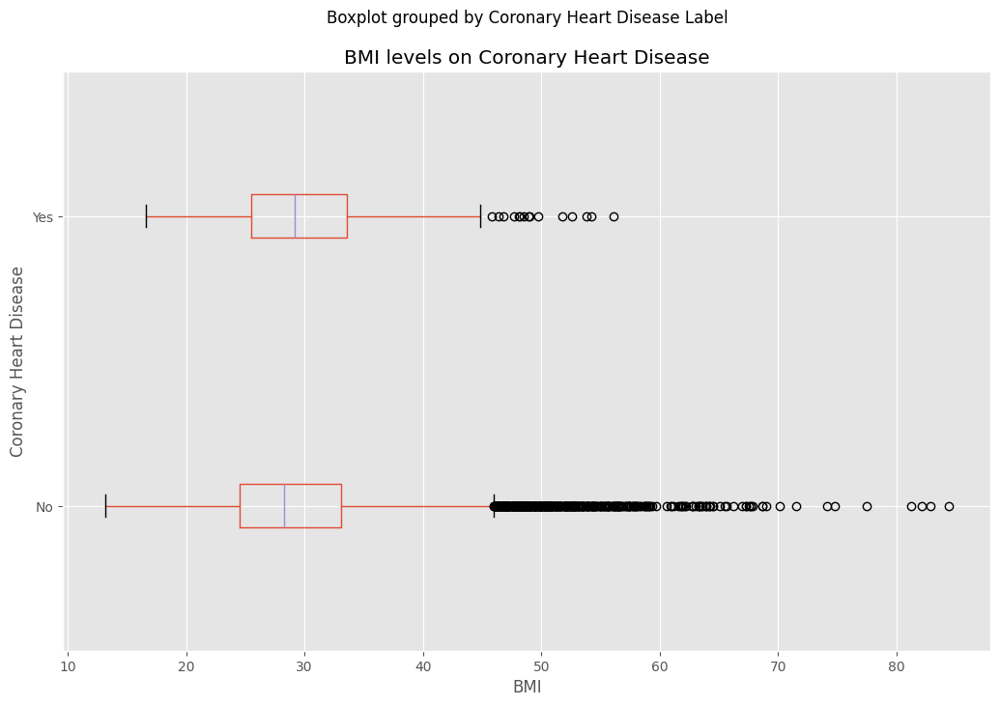

In [ ]:

final_df["Coronary Heart Disease Label"] = final_df["Coronary Heart Disease"].map({1: "Yes", 2: "No"})

final_df.boxplot(column = "BMI", by = "Coronary Heart Disease Label", vert = False)
plt.title("BMI levels on Coronary Heart Disease")
plt.xlabel("BMI")
plt.ylabel("Coronary Heart Disease")
plt.show()



## Visualization 2 - Physical Activity Time in relation to High Blood Pressure

We state literature from the CDC within our backround that encompasses a low portion of individuals embarking upon physically active endeavors, of which we hypothesize could potentially lead to furhter health complications inclduing cardivascular diseases and risk of high blood pressure. To gain some preliminary insights, we will conduct an analysis of physical activity and how it affects indviduals' blood pressure over. We utilize the inactive time individuals in minutes indviduals experience on average in relation to whether or not they have been diagnosed with high blood pressure.





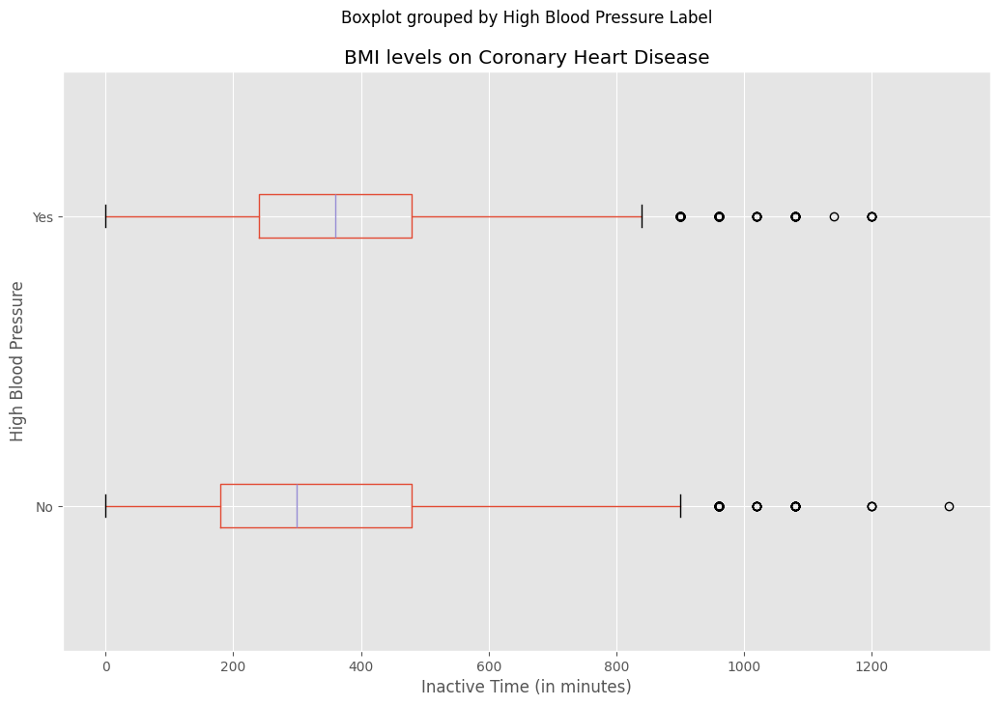

In [ ]:
final_df["High Blood Pressure Label"] = final_df["High Blood Pressure"].map({1: "Yes", 2: "No"})


final_df.boxplot(column = "Inactive Time (in minutes)", by = "High Blood Pressure Label", vert = False)
plt.title("BMI levels on Coronary Heart Disease")
plt.xlabel("Inactive Time (in minutes)")
plt.ylabel("High Blood Pressure")
plt.show()



## Visualization 3 - Diet on Physicial Activity Levels

In order to gain a fond understanding of how active indviduals within our sample are, we aim to understand the effect of diet quality and whether or not it can play a significant role in influecing one's physical activity time. This will enable us to glean on insights of individuals' physical activity levels based on their diets, which can ultimately guide our hypothesis on the approach that unhealtheir indviduals may experience increased risk levels of heart disease and other chronic illnesses.

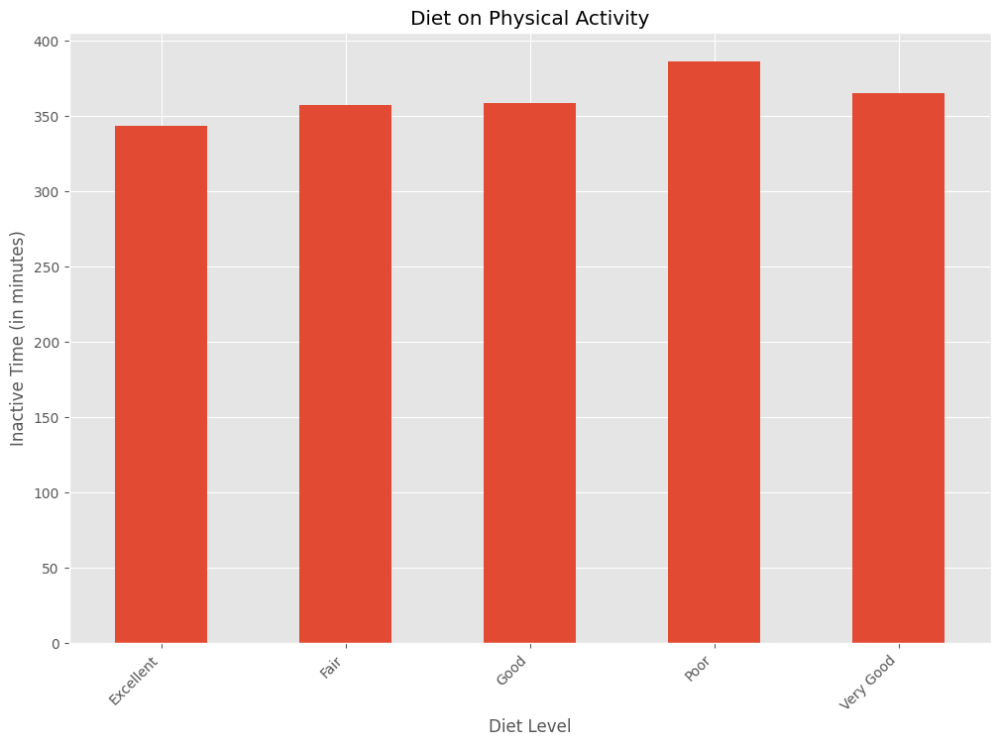

In [ ]:

from matplotlib.ticker import FuncFormatter


diet_map = {
    1: "Excellent",
    2: "Very Good",
    3: "Good",
    4: "Fair",
    5: "Poor",
}


final_df["Healthy Diet Label"] = final_df["Healthy Diet"].map(diet_map)


dep_on_phys = final_df.groupby("Healthy Diet Label")["Inactive Time (in minutes)"].mean()

dep_on_phys.plot(kind="bar", title="Diet on Physical Activity")
plt.xlabel("Diet Level")
plt.xticks(rotation = 45, ha = "right")
plt.ylabel("Inactive Time (in minutes)")

plt.show()


## Visualization 4 - Frequency of depression levels

We inspect the sample distribution of our dataset in respect to depression levels and examine how many of our samples lie within certain ranges of depression. This will enable us to determine the aptitude of mental health scenarios ranging across our entire sample dataset, informing us of the potential health decsions indviduals may embark upon based on their state of mind.

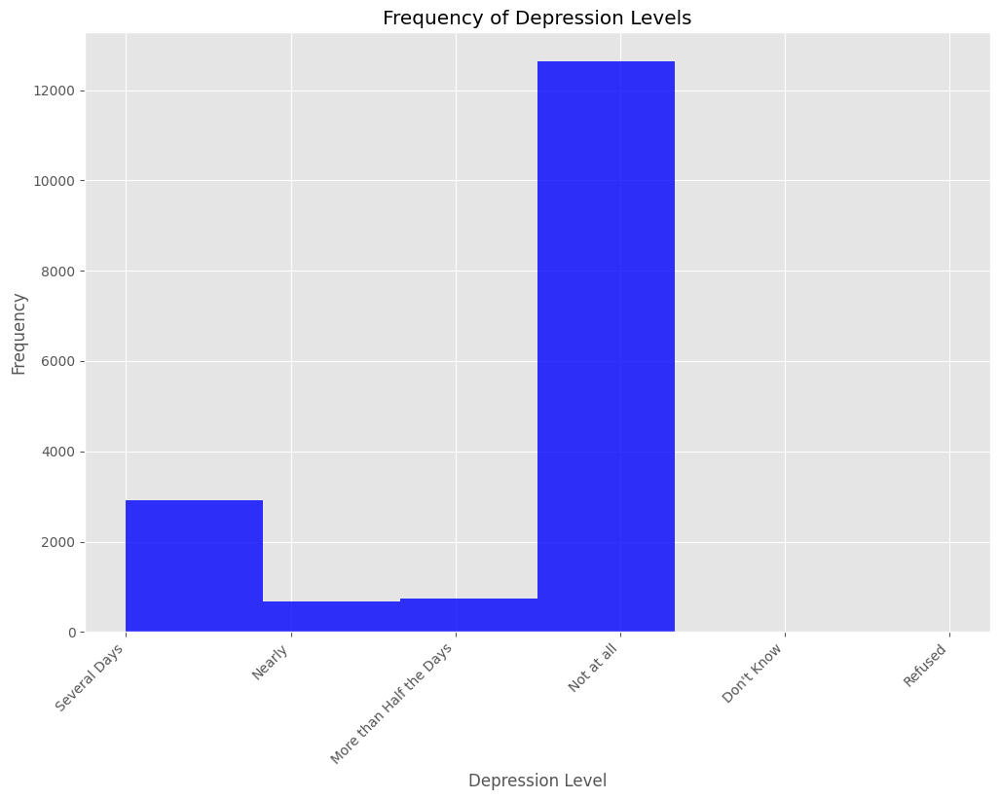

In [ ]:


final_df["Depression"] = final_df["Depression"].apply(pd.to_numeric, errors = "coerce").astype("int64")

depression_map = {
    0: "Not at all",
    1: "Several Days",
    2: "More than Half the Days",
    3: "Nearly",
    7: "Refused",
    9: "Don't Know"
}


final_df["Depression Label"] = final_df["Depression"].map(depression_map)


plt.hist(final_df["Depression Label"], bins = 6, color = "blue", alpha = 0.8)
plt.xlabel("Depression Level")
plt.ylabel("Frequency")
plt.title("Frequency of Depression Levels")
plt.xticks(rotation = 45, ha = "right")

plt.show()


## Visualization 5 - General Health Condition with respect to Age

We believe that gaining an understanding of the general health of the indvidiausl within our sample based on their age can provide us many crucail insights into which age ranges may contain the healthiest all the way to the unhealthiest indviduals. With this knowledge, we can gain a fond understadning of the demographics that need certain attention in the subsequent modeling process soley based on their anticipated health levels.

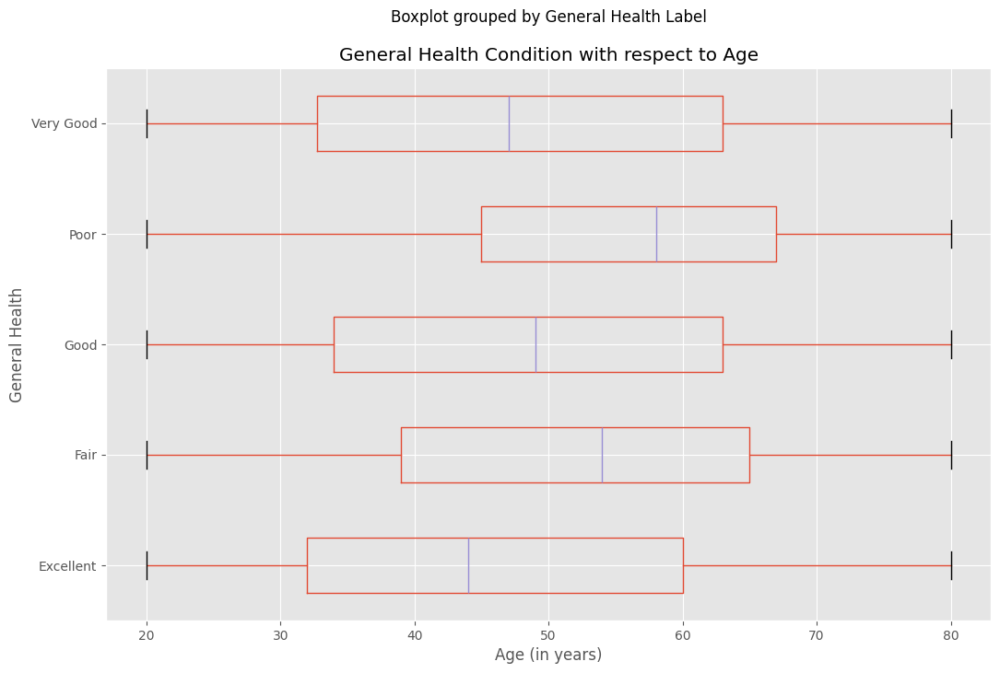

In [ ]:

health_map = {
    1: "Excellent",
    2: "Very Good",
    3: "Good",
    4: "Fair",
    5: "Poor",
    7: "Refused",
    9: "Don't Know"
}


final_df["General Health Label"] = final_df["General Health Condition"].map(health_map)


final_df.boxplot(column = "Age (in years at screening)", by = "General Health Label", vert = False)
plt.title("General Health Condition with respect to Age")
plt.xlabel("Age (in years)")
plt.ylabel("General Health")
plt.show()


# Modeling Part 1


In the first phase of our modeling process, our primary goal is to statistically and meaningfully identify the health status of individuals within our dataset. Because the dataset contains a mix of subjective and objective health indicators, we aim to rely solely on quantifiable biological characteristics and stressor-related variables to infer overall health. To ensure our conclusions are robust, we incorporate several statistical and machine learning methodologies that account for natural variance in individual physiology and life experiences. While this approach may appear complex, it is designed to intuitively group individuals based on the synergy of their biological data and stressor exposures, rather than relying on self-reported health assessments. This enables us to make confident and data-driven assignments of health status for each individual in the dataset.

We begin by applying an unsupervised clustering algorithm to group individuals based on similarities in their health-related features. This step allows us to identify natural divisions in the data and classify individuals into two distinct groups without using any predefined labels. However, the presence of visible clusters alone is not sufficient to confirm meaningful separation. To validate that the observed groupings reflect true statistical differences, we conduct an ANOVA (Analysis of Variance) test. This test evaluates whether the means of each feature significantly differ between the two clusters. If the ANOVA results are statistically significant, we can confidently interpret our clusters as representing meaningful differences in overall health profiles.

To further assess the validity of our clustering approach, we explore the relationship between our cluster assignments and individuals’ self-reported health levels, which range from 1 (excellent) to 5 (very poor). We hypothesize that one cluster corresponds to individuals with better health (lower self-reported scores), while the other represents those with poorer health (higher scores). To test this relationship, we perform a Chi-Square test of independence. A statistically significant result would indicate a strong association between cluster membership and perceived health, thereby reinforcing the validity of our clusters in capturing real-world health differences.

Finally, with confidence in the reliability of our clusters, we use these groupings to generate labeled target variables for supervised learning. We train a neural network model to predict each individual’s health status based solely on their biological and stressor features. If the model achieves strong performance, it confirms that these input variables contain sufficient information to accurately infer health status. This final step not only validates the meaningfulness of our cluster assignments but also demonstrates the predictive power of the features in determining an individual’s overall health. Through this multi-step process, we build a fully data-driven and statistically grounded framework for assessing health status in a diverse population.




## Variable 1: General Health Condition
Would you say your health in general on a Scale of 1 - 5 is
- 1: Excellent
- 2: Very good
- 3: Good
- 4: Fair
- 5: Poor

## Variable 2: BMI
- Measured by computing (kg/m ** 2)

## Variable 3: High Blood Pressure
Have you ever been told by a doctor or other health professional that you had hypertension, also called high blood pressure?
- 1: Yes
- 2: No

## Variable 4: Diabetes
Other than during pregnancy, have you ever been told by a doctor or health professional that you have diabetes or sugar diabetes?
- 1: Yes
- 2: No
- 3: Somewhat

## Variable 5: Depression
Other than during pregnancy, have you ever been told by a doctor or health professional that you have diabetes or sugar diabetes?
- 0: Not at all
- 1: Several days
- 2: More than half the days
- 3: Neary every day

## Variable 6: Coronary Heart Disease
Has a doctor or other health professional ever told you that you had coronary heart disease?
- 1: Yes
- 2: No

## Variable 7: Physical Activity
How much time do you usually spend sitting or reclining on a typical day?
- Range of values in minutes

## Variable 8: Diet Health
In general, how healthy is your overall diet? Would you say
- 1: Excellent
- 2: Very good
- 3: Good
- 4: Fair
- 5: Poor

## Variable 9: Smoking Frequency
Have you smoked at least 100 cigarettes in your entire life?
- 1: Yes
- 2: No

## Variable 10: Sleeping Time
How much sleep do you usually get at night on weekdays or workdays?
- Range of values in hours

## Variable 11: Age
- Range of values in years


In [ ]:


final_df.set_index("SEQN", inplace = True)
final_df_model = final_df.drop(final_df.columns[-5:], axis = 1)
final_df_model

,General Health Condition,BMI,High Blood Pressure,Diabetes,Depression,Coronary Heart Disease,Inactive Time (in minutes),Healthy Diet,Smoked at least 100 cigs in life,Average Sleep Hours (on workdays),Age (in years at screening)
SEQN,,,,,,,,,,,
51624.0,3.0,32.22,2.0,2.0,1,2.0,480.0,3.0,1.0,4.0,34.0
51628.0,4.0,42.39,1.0,1.0,3,2.0,240.0,4.0,1.0,4.0,60.0
51629.0,3.0,32.61,2.0,2.0,2,2.0,720.0,3.0,1.0,4.0,26.0
51630.0,3.0,30.57,1.0,2.0,1,2.0,240.0,3.0,1.0,8.0,49.0
51633.0,1.0,26.04,2.0,2.0,0,2.0,60.0,1.0,1.0,6.0,80.0
...,...,...,...,...,...,...,...,...,...,...,...
102949.0,1.0,23.70,2.0,2.0,0,2.0,60.0,1.0,1.0,6.5,33.0
102952.0,2.0,20.00,2.0,3.0,0,2.0,120.0,1.0,2.0,8.5,70.0
102953.0,4.0,35.80,2.0,2.0,1,2.0,360.0,5.0,1.0,6.0,42.0


In [ ]:

final_df_model = final_df_model[~final_df_model["Depression"].isin([7, 9])]


In [ ]:

final_df_model = pd.get_dummies(final_df_model,
                                columns = ["High Blood Pressure", "Coronary Heart Disease",
                                           "Smoked at least 100 cigs in life"],
                                drop_first = True, dtype = "int64")


final_df_model

,General Health Condition,BMI,Diabetes,Depression,Inactive Time (in minutes),Healthy Diet,Average Sleep Hours (on workdays),Age (in years at screening),High Blood Pressure_2.0,Coronary Heart Disease_2.0,Smoked at least 100 cigs in life_2.0
SEQN,,,,,,,,,,,
51624.0,3.0,32.22,2.0,1,480.0,3.0,4.0,34.0,1,1,0
51628.0,4.0,42.39,1.0,3,240.0,4.0,4.0,60.0,0,1,0
51629.0,3.0,32.61,2.0,2,720.0,3.0,4.0,26.0,1,1,0
51630.0,3.0,30.57,2.0,1,240.0,3.0,8.0,49.0,0,1,0
51633.0,1.0,26.04,2.0,0,60.0,1.0,6.0,80.0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...
102949.0,1.0,23.70,2.0,0,60.0,1.0,6.5,33.0,1,1,0
102952.0,2.0,20.00,3.0,0,120.0,1.0,8.5,70.0,1,1,1
102953.0,4.0,35.80,2.0,1,360.0,5.0,6.0,42.0,1,1,0


In [ ]:

final_df_model.rename(columns = {"High Blood Pressure_2.0": "High Blood Pressure", "Coronary Heart Disease_2.0": "Coronary Heart Disease",
                                 "Smoked at least 100 cigs in life_2.0": "Smoked at least 100 cigs in life"}, inplace = True)

final_df_model


,General Health Condition,BMI,Diabetes,Depression,Inactive Time (in minutes),Healthy Diet,Average Sleep Hours (on workdays),Age (in years at screening),High Blood Pressure,Coronary Heart Disease,Smoked at least 100 cigs in life
SEQN,,,,,,,,,,,
51624.0,3.0,32.22,2.0,1,480.0,3.0,4.0,34.0,1,1,0
51628.0,4.0,42.39,1.0,3,240.0,4.0,4.0,60.0,0,1,0
51629.0,3.0,32.61,2.0,2,720.0,3.0,4.0,26.0,1,1,0
51630.0,3.0,30.57,2.0,1,240.0,3.0,8.0,49.0,0,1,0
51633.0,1.0,26.04,2.0,0,60.0,1.0,6.0,80.0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...
102949.0,1.0,23.70,2.0,0,60.0,1.0,6.5,33.0,1,1,0
102952.0,2.0,20.00,3.0,0,120.0,1.0,8.5,70.0,1,1,1
102953.0,4.0,35.80,2.0,1,360.0,5.0,6.0,42.0,1,1,0


In [ ]:

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaled = scaler.fit_transform(final_df_model.iloc[:, :8])


scaled_df = pd.DataFrame(scaled, columns = final_df_model.columns[:8], index = final_df_model.index)
scaled_df



,General Health Condition,BMI,Diabetes,Depression,Inactive Time (in minutes),Healthy Diet,Average Sleep Hours (on workdays),Age (in years at screening)
SEQN,,,,,,,,
51624.0,0.133410,0.371065,0.290199,0.834236,0.591891,-0.025138,-1.246219,-0.892985
51628.0,1.160763,1.779997,-2.258170,3.510639,-0.594794,0.961569,-1.246219,0.588860
51629.0,0.133410,0.425094,0.290199,2.172438,1.778575,-0.025138,-1.246219,-1.348937
51630.0,0.133410,0.142477,0.290199,0.834236,-0.594794,-0.025138,0.394315,-0.038074
51633.0,-1.921297,-0.485101,0.290199,-0.503966,-1.484807,-1.998550,-0.425952,1.728740
...,...,...,...,...,...,...,...,...
102949.0,-1.921297,-0.809281,0.290199,-0.503966,-1.484807,-1.998550,-0.220885,-0.949979
102952.0,-0.893944,-1.321872,2.838568,-0.503966,-1.188136,-1.998550,0.599382,1.158800
102953.0,1.160763,0.867031,0.290199,0.834236,-0.001452,1.948275,-0.425952,-0.437033


In [ ]:

dummy_vals = pd.DataFrame(final_df_model.iloc[:, -3:],
                          columns = final_df_model.columns[-3:],
                          index = final_df_model.index)

scaled_df = pd.concat([scaled_df, dummy_vals], axis = 1)
scaled_df


,General Health Condition,BMI,Diabetes,Depression,Inactive Time (in minutes),Healthy Diet,Average Sleep Hours (on workdays),Age (in years at screening),High Blood Pressure,Coronary Heart Disease,Smoked at least 100 cigs in life
SEQN,,,,,,,,,,,
51624.0,0.133410,0.371065,0.290199,0.834236,0.591891,-0.025138,-1.246219,-0.892985,1,1,0
51628.0,1.160763,1.779997,-2.258170,3.510639,-0.594794,0.961569,-1.246219,0.588860,0,1,0
51629.0,0.133410,0.425094,0.290199,2.172438,1.778575,-0.025138,-1.246219,-1.348937,1,1,0
51630.0,0.133410,0.142477,0.290199,0.834236,-0.594794,-0.025138,0.394315,-0.038074,0,1,0
51633.0,-1.921297,-0.485101,0.290199,-0.503966,-1.484807,-1.998550,-0.425952,1.728740,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...
102949.0,-1.921297,-0.809281,0.290199,-0.503966,-1.484807,-1.998550,-0.220885,-0.949979,1,1,0
102952.0,-0.893944,-1.321872,2.838568,-0.503966,-1.188136,-1.998550,0.599382,1.158800,1,1,1
102953.0,1.160763,0.867031,0.290199,0.834236,-0.001452,1.948275,-0.425952,-0.437033,1,1,0


In [ ]:

scaled_df.drop(columns = ["General Health Condition"], inplace = True)
scaled_df


,BMI,Diabetes,Depression,Inactive Time (in minutes),Healthy Diet,Average Sleep Hours (on workdays),Age (in years at screening),High Blood Pressure,Coronary Heart Disease,Smoked at least 100 cigs in life
SEQN,,,,,,,,,,
51624.0,0.371065,0.290199,0.834236,0.591891,-0.025138,-1.246219,-0.892985,1,1,0
51628.0,1.779997,-2.258170,3.510639,-0.594794,0.961569,-1.246219,0.588860,0,1,0
51629.0,0.425094,0.290199,2.172438,1.778575,-0.025138,-1.246219,-1.348937,1,1,0
51630.0,0.142477,0.290199,0.834236,-0.594794,-0.025138,0.394315,-0.038074,0,1,0
51633.0,-0.485101,0.290199,-0.503966,-1.484807,-1.998550,-0.425952,1.728740,1,1,0
...,...,...,...,...,...,...,...,...,...,...
102949.0,-0.809281,0.290199,-0.503966,-1.484807,-1.998550,-0.220885,-0.949979,1,1,0
102952.0,-1.321872,2.838568,-0.503966,-1.188136,-1.998550,0.599382,1.158800,1,1,1
102953.0,0.867031,0.290199,0.834236,-0.001452,1.948275,-0.425952,-0.437033,1,1,0


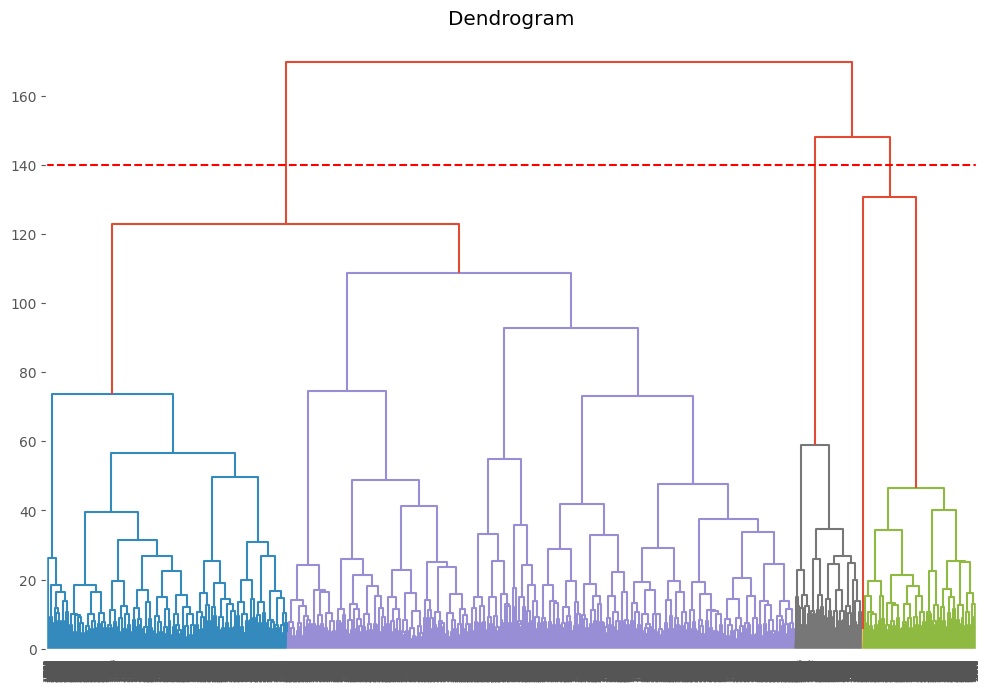

In [ ]:

from scipy.cluster.hierarchy import dendrogram, linkage

plt.title("Dendrogram")
dend = dendrogram(linkage(scaled_df, method = "ward"))
plt.axhline(y = 140, color = "r", linestyle = "--")
plt.show()


In [ ]:


from sklearn.cluster import AgglomerativeClustering

model = AgglomerativeClustering(n_clusters = 3, metric = "euclidean", linkage = "ward")
clusters = model.fit_predict(scaled_df)
clusters



array([1, 2, 2, ..., 1, 1, 1])

In [ ]:

final_df_model["Cluster"] = clusters
final_df_model


,General Health Condition,BMI,Diabetes,Depression,Inactive Time (in minutes),Healthy Diet,Average Sleep Hours (on workdays),Age (in years at screening),High Blood Pressure,Coronary Heart Disease,Smoked at least 100 cigs in life,Cluster
SEQN,,,,,,,,,,,,
51624.0,3.0,32.22,2.0,1,480.0,3.0,4.0,34.0,1,1,0,1
51628.0,4.0,42.39,1.0,3,240.0,4.0,4.0,60.0,0,1,0,2
51629.0,3.0,32.61,2.0,2,720.0,3.0,4.0,26.0,1,1,0,2
51630.0,3.0,30.57,2.0,1,240.0,3.0,8.0,49.0,0,1,0,1
51633.0,1.0,26.04,2.0,0,60.0,1.0,6.0,80.0,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
102949.0,1.0,23.70,2.0,0,60.0,1.0,6.5,33.0,1,1,0,1
102952.0,2.0,20.00,3.0,0,120.0,1.0,8.5,70.0,1,1,1,1
102953.0,4.0,35.80,2.0,1,360.0,5.0,6.0,42.0,1,1,0,1


In [ ]:

from scipy.stats import f_oneway


f_stat = {}

p_value = {}

cluster_groups = {}

for col in final_df_model.columns[:-1]:
  cluster_groups[col] = [final_df_model[final_df_model["Cluster"] == i][col]
                         for i in final_df_model["Cluster"].unique()]

  f_stat[col], p_value[col] = f_oneway(*cluster_groups[col])

final_anova_table = pd.DataFrame({"F-Statistic": f_stat, "p-value": p_value})
final_anova_table["p-value"] = final_anova_table["p-value"].apply(lambda x: "{:.6f}".format(x))

final_anova_table



,F-Statistic,p-value
General Health Condition,698.836610,0.000000
BMI,170.067016,0.000000
Diabetes,22444.579982,0.000000
Depression,15511.570835,0.000000
Inactive Time (in minutes),17.645441,0.000000
Healthy Diet,90.782500,0.000000
Average Sleep Hours (on workdays),23.395653,0.000000
Age (in years at screening),635.926309,0.000000
High Blood Pressure,614.452265,0.000000
Coronary Heart Disease,155.742000,0.000000


In [ ]:

cluster_means = final_df_model.groupby("Cluster").mean()
cluster_means


,General Health Condition,BMI,Diabetes,Depression,Inactive Time (in minutes),Healthy Diet,Average Sleep Hours (on workdays),Age (in years at screening),High Blood Pressure,Coronary Heart Disease,Smoked at least 100 cigs in life
Cluster,,,,,,,,,,,
0,3.311984,32.093314,1.001456,0.228530,376.255216,3.084425,7.362445,61.978651,0.302280,0.891800,0.506550
1,2.740906,29.075729,2.027446,0.205299,355.825221,2.984630,7.007539,47.734904,0.680012,0.971456,0.572715
2,3.563666,30.438305,1.798865,2.522303,383.127332,3.379562,6.841038,50.511760,0.520681,0.939173,0.429846


In [ ]:


final_df["Cluster_Label"] = final_df_model["Cluster"].map({0: "Poor Health", 1: "Good Health", 2: "Average Health"})
final_df["Cluster"] = final_df_model["Cluster"]
final_df


,General Health Condition,BMI,High Blood Pressure,Diabetes,Depression,Coronary Heart Disease,Inactive Time (in minutes),Healthy Diet,Smoked at least 100 cigs in life,Average Sleep Hours (on workdays),Age (in years at screening),Coronary Heart Disease Label,High Blood Pressure Label,Healthy Diet Label,Depression Label,General Health Label,Cluster_Label,Cluster
SEQN,,,,,,,,,,,,,,,,,,
51624.0,3.0,32.22,2.0,2.0,1,2.0,480.0,3.0,1.0,4.0,34.0,No,No,Good,Several Days,Good,Good Health,1.0
51628.0,4.0,42.39,1.0,1.0,3,2.0,240.0,4.0,1.0,4.0,60.0,No,Yes,Fair,Nearly,Fair,Average Health,2.0
51629.0,3.0,32.61,2.0,2.0,2,2.0,720.0,3.0,1.0,4.0,26.0,No,No,Good,More than Half the Days,Good,Average Health,2.0
51630.0,3.0,30.57,1.0,2.0,1,2.0,240.0,3.0,1.0,8.0,49.0,No,Yes,Good,Several Days,Good,Good Health,1.0
51633.0,1.0,26.04,2.0,2.0,0,2.0,60.0,1.0,1.0,6.0,80.0,No,No,Excellent,Not at all,Excellent,Good Health,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102949.0,1.0,23.70,2.0,2.0,0,2.0,60.0,1.0,1.0,6.5,33.0,No,No,Excellent,Not at all,Excellent,Good Health,1.0
102952.0,2.0,20.00,2.0,3.0,0,2.0,120.0,1.0,2.0,8.5,70.0,No,No,Excellent,Not at all,Very Good,Good Health,1.0
102953.0,4.0,35.80,2.0,2.0,1,2.0,360.0,5.0,1.0,6.0,42.0,No,No,Poor,Several Days,Fair,Good Health,1.0


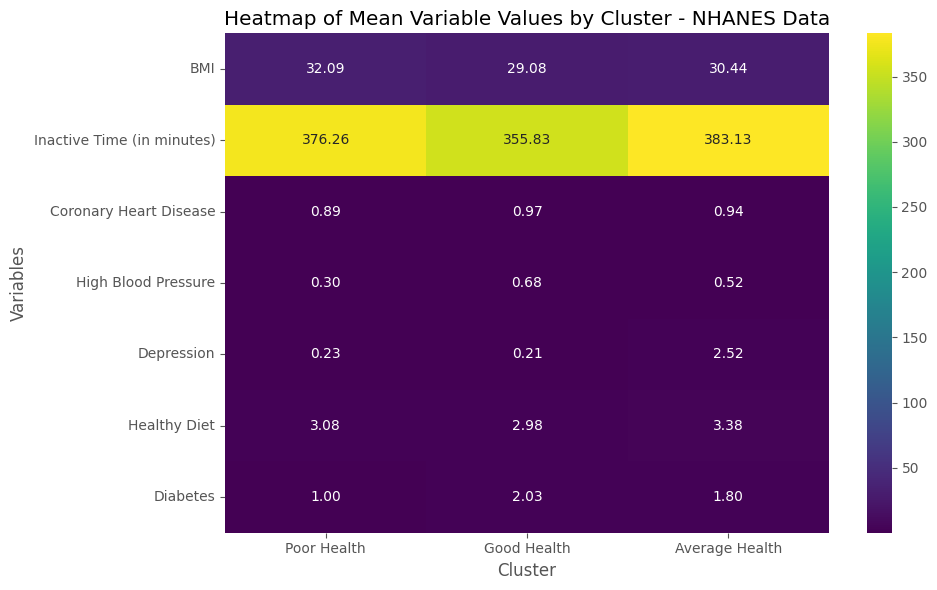

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


cluster_means_hm = cluster_means[["BMI", "Inactive Time (in minutes)",
                                  "Coronary Heart Disease", "High Blood Pressure", "Depression", "Healthy Diet", "Diabetes"]]

cluster_means_hm.index = ["Poor Health", "Good Health", "Average Health"]

plt.figure(figsize=(10, 6))
sns.heatmap(cluster_means_hm.T, annot=True, fmt=".2f", cmap="viridis", cbar=True)
plt.title("Heatmap of Mean Variable Values by Cluster - NHANES Data")
plt.ylabel("Variables")
plt.xlabel("Cluster")
plt.tight_layout()
plt.show()



Caption for Image: Figure 1. Mean health indicator values by cluster (NHANES data). (Explain General Health Scale)
- Coronary Heart Disease: On a scale of 0-1 with 0 being Yes and 1 being No
- High Blood Pressure: On a scale of 0-1 with 0 being Yes and 1 being No
- Depression: On a scale of 0-3 with 0 being Not at All, 1 being Sometimes, 2 being Several days, and 3 being Nearly Everyday

In [ ]:

!pip install statsmodels


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 104.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.9/232.9 kB 14.0 MB/s eta 0:00:00


In [ ]:


import statsmodels.api as sm

x = final_df_model["Cluster"]
y = final_df_model["General Health Condition"]


x_const = sm.add_constant(x)

model = sm.OLS(y, x_const).fit()

print(model.summary())



                               OLS Regression Results                               
Dep. Variable:     General Health Condition   R-squared:                       0.000
Model:                                  OLS   Adj. R-squared:                 -0.000
Method:                       Least Squares   F-statistic:                     1.000
Date:                      Wed, 07 May 2025   Prob (F-statistic):              0.317
Time:                              20:59:56   Log-Likelihood:                -23603.
No. Observations:                     16957   AIC:                         4.721e+04
Df Residuals:                         16955   BIC:                         4.723e+04
Df Model:                                 1                                         
Covariance Type:                  nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

In [ ]:


from scipy.stats import chi2_contingency

contin_table = pd.crosstab(final_df_model["Cluster"], final_df_model["General Health Condition"])

chi2, p, dof, expected = chi2_contingency(contin_table)

print("\nChi-Square Test Results:")
print("Chi-square statistic:", chi2)
print("p-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies:\n", expected)


Chi-Square Test Results:
Chi-square statistic: 1612.8525916147655
p-value: 0.0
Degrees of freedom: 8
Expected frequencies:
 [[ 179.64014861  509.38556348  850.1913664   442.53706434   79.24585717]
 [1190.88954414 3376.87285487 5636.17886419 2933.71368756  525.34504924]
 [ 107.47030725  304.74158165  508.62976942  264.7492481    47.40909359]]


In [ ]:

!pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 599.6 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 53.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 57.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 62.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 66.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 4.4 MB/s eta 0:00:00


In [ ]:

from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dropout, Dense
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
import datetime

scaled_df["Health Level"] = final_df_model["Cluster"]
#scaled_df.drop(columns = ["General Health Condition"], inplace = True)
scaled_df



,BMI,Diabetes,Depression,Inactive Time (in minutes),Healthy Diet,Average Sleep Hours (on workdays),Age (in years at screening),High Blood Pressure,Coronary Heart Disease,Smoked at least 100 cigs in life,Health Level
SEQN,,,,,,,,,,,
51624.0,0.371065,0.290199,0.834236,0.591891,-0.025138,-1.246219,-0.892985,1,1,0,1
51628.0,1.779997,-2.258170,3.510639,-0.594794,0.961569,-1.246219,0.588860,0,1,0,2
51629.0,0.425094,0.290199,2.172438,1.778575,-0.025138,-1.246219,-1.348937,1,1,0,2
51630.0,0.142477,0.290199,0.834236,-0.594794,-0.025138,0.394315,-0.038074,0,1,0,1
51633.0,-0.485101,0.290199,-0.503966,-1.484807,-1.998550,-0.425952,1.728740,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...
102949.0,-0.809281,0.290199,-0.503966,-1.484807,-1.998550,-0.220885,-0.949979,1,1,0,1
102952.0,-1.321872,2.838568,-0.503966,-1.188136,-1.998550,0.599382,1.158800,1,1,1,1
102953.0,0.867031,0.290199,0.834236,-0.001452,1.948275,-0.425952,-0.437033,1,1,0,1


In [ ]:

final_train, final_test = train_test_split(scaled_df, test_size = 0.2, random_state = 42)

x_train = final_train.drop(columns = ["Health Level"])
x_test = final_test.drop(columns = ["Health Level"])

y_train = final_train["Health Level"]
y_test = final_test["Health Level"]

print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)


(13565, 10) (3392, 10) (13565,) (3392,)


In [ ]:



input_layer = Input(shape = (x_train.shape[1], ), name = "Env_And_Stress_Vars")
hidden_layer_1 = Dense(64, activation = "relu", name = "Hidden_Layer_1") (input_layer)
dropout = Dropout(0.2, name = "Dropout_Layer") (hidden_layer_1)
hidden_layer_2 = Dense(32, activation = "relu", name = "Hidden_Layer_2") (dropout)
output_layer = Dense(3, activation = "softmax", name = "Health_Level") (hidden_layer_2)

model = Model(inputs = input_layer, outputs = output_layer)

model.compile(optimizer = Adam(learning_rate = 0.001), loss = "sparse_categorical_crossentropy",
              metrics = ["accuracy"])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Env_And_Stress_Vars             │ (None, 10)             │             0 │
│ (InputLayer)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Hidden_Layer_1 (Dense)          │ (None, 64)             │           704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dropout_Layer (Dropout)         │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Hidden_Layer_2 (Dense)          │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Health_Level (Dense)            │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,883 (11.26 KB)

 Trainable params: 2,883 (11.26 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:


log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,
    write_graph=True,
    write_images=True
)



In [ ]:



model.fit(x_train, y_train, batch_size = 64, epochs = 50, validation_data = (x_test, y_test),
          callbacks = [tensorboard_callback])


Epoch 1/50
212/212 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8402 - loss: 0.4514 - val_accuracy: 0.9873 - val_loss: 0.0414
Epoch 2/50
212/212 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9822 - loss: 0.0566 - val_accuracy: 0.9885 - val_loss: 0.0300
Epoch 3/50
212/212 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9850 - loss: 0.0414 - val_accuracy: 0.9888 - val_loss: 0.0269
Epoch 4/50
212/212 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9880 - loss: 0.0348 - val_accuracy: 0.9903 - val_loss: 0.0231
Epoch 5/50
212/212 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9871 - loss: 0.0365 - val_accuracy: 0.9915 - val_loss: 0.0215
Epoch 6/50
212/212 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9879 - loss: 0.0322 - val_accuracy: 0.9915 - val_loss: 0.0204
Epoch 7/50
212/212 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9895 - loss: 0.0278 - val_accuracy: 0.9917 - val_loss: 0.0200
Epoch 8/50
212/212 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9897 - loss: 0.0288 - val_accuracy: 0.

In [ ]:

results = model.evaluate(x_test, y_test, return_dict = True)
print(results)


106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9954 - loss: 0.0110
{'accuracy': 0.9952830076217651, 'loss': 0.01347875501960516}


In [ ]:
!apt-get install -y graphviz
!pip install graphviz
!pip install pydot

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 0 not upgraded.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.1/47.1 kB 1.8 MB/s eta 0:00:00


In [ ]:

from tensorflow.keras.utils import plot_model

plot_model(model, to_file = "model_architecture.png", show_shapes = True, show_layer_names = True)


You must install pydot (`pip install pydot`) for `plot_model` to work.


In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/fit


<IPython.core.display.Javascript object>

# Modeling Phase 1 Results:
ANOVA test resulted in p-values for all variables significantly under 0
Chi-Square test resulted in extremely low p value
Neural Network testing data accuracy at 99%.



# Modeling Phase 2



## Key Variable: DUPERSID - PERSON ID (DUID + PID)
- Sample Individual identifier ID

## Variable 1: ADINTR42 - Little interest in activities
- -15 CANNOT BE COMPUTED
- -1 INAPPLICABLE
- 0 NOT AT ALL
- 1 SEVERAL DAYS
- 2 MORE THAN HALF THE DAYS
- 3 NEARLY EVERY DAY



## Variable 2: ADDPRS42 - Felt depressed
- -15 CANNOT BE COMPUTED
- -1 INAPPLICABLE
- 0 NOT AT ALL
- 1 SEVERAL DAYS
- 2 MORE THAN HALF THE DAYS
- 3 NEARLY EVERY DAY


## Variable 3: K6SUM42 - Psychological distress score
- -15 CANNOT BE COMPUTED
- -1 INAPPLICABLE
- 0 RATING OF LAST 30 DAYS
- 1-12 RATING OF LAST 30 DAYS
- 13-24 RATING OF LAST 30 DAYS

## Variable 4: ARTHDX - Arthritis diagnosis
- -15 CANNOT BE COMPUTED
- -8 DK
- -7 REFUSED
- -1 INAPPLICABLE
- 1 YES
- 2 NO

## Variable 5: ASTHDX - Asthma diagnosis
- -15 CANNOT BE COMPUTED
- -8 DK
- -7 REFUSED
- -1 INAPPLICABLE
- 1 YES
- 2 NO

## Variable 6: BPMLDX - High BP diagnosis
- -8 DK
- -7 REFUSED
- -1 INAPPLICABLE
- 1 YES
- 2 NO

## Variable 7: CANCERDX - Cancer diagnosis
- -15 CANNOT BE COMPUTED
- -8 DK
- -7 REFUSED
- -1 INAPPLICABLE
- 1 YES
- 2 NO

## Variable 8: CHDDX - Coronary heart disease
- -15 CANNOT BE COMPUTED
- -8 DK
- -7 REFUSED
- -1 INAPPLICABLE
- 1 YES
- 2 NO

## Variable 9: DIABDX_M18 - Diabetes diagnosis
- -15 CANNOT BE COMPUTED
- -8 DK
- -7 REFUSED
- -1 INAPPLICABLE
- 1 YES
- 2 NO

## Variable 10: CHOLDX - High cholesterol
- -15 CANNOT BE COMPUTED
- -8 DK
- -7 REFUSED
- -1 INAPPLICABLE
- 1 YES
- 2 NO

## Variable 11: ADWKLM42 - Health limits work
- -15 CANNOT BE COMPUTED
- -1 INAPPLICABLE
- 1 NONE OF THE TIME
- 2 LITTLE OF THE TIME
- 3 SOME OF THE TIME
- 4 MOST OF THE TIME
- 5 ALL OF THE TIME



## Variable 12: ADDAYA42 - Health limits activities
- -15 CANNOT BE COMPUTED
- -1 INAPPLICABLE
- 1 LIMITED A LOT
- 2 LIMITED A LITTLE
- 3 NOT LIMITED




## Variable 13: ADSOCA42 - Health stopped social activity
- -15 CANNOT BE COMPUTED
- -1 INAPPLICABLE
- 1 ALL OF THE TIME
- 2 MOST OF THE TIME
- 3 SOME OF THE TIME
- 4 LITTLE OF THE TIME
- 5 NONE OF THE TIME


## Variable 14: TOTSLF - TOTAL AMT PAID BY SELF/FAMILY - Out of pocket
- Continuous Values (in dollars)

## Variables 15: TOTTCH - TOTAL HEALTH CARE CHARGES 19, EXCL RX - Hospital Charges
- Continuous Values (in dollars)

## Variables 16: TOTMCR - TOTAL AMT PAID BY MEDICARE 19
- Continuous Values (in dollars)

## Variables 17: TOTMCD - TOTAL AMT PAID BY MEDICAID 19
- Continuous Values (in dollars)

## Variables 18: TOTPRV - TOTAL AMT PAID BY PRIVATE INS 19
- Continuous Values (in dollars)

## Variables 19: TOTEX - TOTAL HEALTH CARE EXP 19
- Continous Values (in dollars)
   

In [ ]:
'''
!pip install -q openpyxl
import os

files = {
    "/content/drive/MyDrive/DTSC_4301/All_Python_Files/h209.xlsx": 2018,
    "/content/drive/MyDrive/DTSC_4301/All_Python_Files/h216.xlsx": 2019,
    "/content/drive/MyDrive/DTSC_4301/All_Python_Files/H224.xlsx": 2020,
    "/content/drive/MyDrive/DTSC_4301/All_Python_Files/h233.xlsx": 2021,
    "/content/drive/MyDrive/DTSC_4301/All_Python_Files/h243.xlsx": 2022
}


columns_to_keep = [
    'DUPERSID', 'ADINTR42', 'ADSAD42', 'ADDPRS42', 'ADWRTH42',
    'ADHOPE42', 'K6SUM42', 'ARTHDX', 'ASTHDX', 'BPMLDX', 'CANCERDX',
    'CHDDX', 'DIABDX_M18', 'HIBPDX', 'CHOLDX', 'ADWKLM42',
    'ADDAYA42', 'ADSOCA42'
]

# Standardize variable names across years
Standard_var = {
    'AGE18X': 'AGE', 'AGE19X': 'AGE', 'AGE20X': 'AGE', 'AGE21X': 'AGE', 'AGE22X': 'AGE',
    'TOTEXP18': 'TOTEX', 'TOTEXP19': 'TOTEX', 'TOTEXP20': 'TOTEX', 'TOTEXP21': 'TOTEX', 'TOTEXP22': 'TOTEX',
    'TOTSLF18': 'TOTSLF', 'TOTSLF19': 'TOTSLF', 'TOTSLF20': 'TOTSLF', 'TOTSLF21': 'TOTSLF', 'TOTSLF22': 'TOTSLF',
    'TOTTCH18': 'TOTTCH', 'TOTTCH19': 'TOTTCH', 'TOTTCH20': 'TOTTCH', 'TOTTCH21': 'TOTTCH', 'TOTTCH22': 'TOTTCH',
    'TOTMCR18': 'TOTMCR', 'TOTMCR19': 'TOTMCR', 'TOTMCR20': 'TOTMCR', 'TOTMCR21': 'TOTMCR', 'TOTMCR22': 'TOTMCR',
    'TOTMCD18': 'TOTMCD', 'TOTMCD19': 'TOTMCD', 'TOTMCD20': 'TOTMCD', 'TOTMCD21': 'TOTMCD', 'TOTMCD22': 'TOTMCD',
    'TOTPRV18': 'TOTPRV', 'TOTPRV19': 'TOTPRV', 'TOTPRV20': 'TOTPRV', 'TOTPRV21': 'TOTPRV', 'TOTPRV22': 'TOTPRV'
}


combined_data = []

for file_path, year in files.items():
    if os.path.exists(file_path):
        print(f"Loading: {file_path}")
        df = pd.read_excel(file_path, engine='openpyxl')
        df['YEAR'] = year


        df = df.rename(columns=Standard_var)


        cols_to_include = [col for col in columns_to_keep if col in df.columns]
        for std_col in set(Standard_var.values()):
            if std_col in df.columns:
                cols_to_include.append(std_col)


        cols_to_include.append('YEAR')


        filtered = df[cols_to_include]
        combined_data.append(filtered)
    else:
        print(f"File not found: {file_path}")


if combined_data:
    final_df = pd.concat(combined_data, ignore_index=True)
    print("✅ All files loaded and combined successfully.")
    display(final_df.head())
else:
    print("⚠️ No files were loaded. Please check your file paths.")


final_df
'''

'\n!pip install -q openpyxl\nimport os\n\nfiles = {\n    "/content/drive/MyDrive/DTSC_4301/All_Python_Files/h209.xlsx": 2018,\n    "/content/drive/MyDrive/DTSC_4301/All_Python_Files/h216.xlsx": 2019,\n    "/content/drive/MyDrive/DTSC_4301/All_Python_Files/H224.xlsx": 2020,\n    "/content/drive/MyDrive/DTSC_4301/All_Python_Files/h233.xlsx": 2021,\n    "/content/drive/MyDrive/DTSC_4301/All_Python_Files/h243.xlsx": 2022\n}\n\n\ncolumns_to_keep = [\n    \'DUPERSID\', \'ADINTR42\', \'ADSAD42\', \'ADDPRS42\', \'ADWRTH42\',\n    \'ADHOPE42\', \'K6SUM42\', \'ARTHDX\', \'ASTHDX\', \'BPMLDX\', \'CANCERDX\',\n    \'CHDDX\', \'DIABDX_M18\', \'HIBPDX\', \'CHOLDX\', \'ADWKLM42\',\n    \'ADDAYA42\', \'ADSOCA42\'\n]\n\n# Standardize variable names across years\nStandard_var = {\n    \'AGE18X\': \'AGE\', \'AGE19X\': \'AGE\', \'AGE20X\': \'AGE\', \'AGE21X\': \'AGE\', \'AGE22X\': \'AGE\',\n    \'TOTEXP18\': \'TOTEX\', \'TOTEXP19\': \'TOTEX\', \'TOTEXP20\': \'TOTEX\', \'TOTEXP21\': \'TOTEX\', \'TOTEXP22\'

In [ ]:
!pip install openpyxl
meps_df = pd.read_excel("combined_data.xlsx")
meps_df


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.9/250.9 kB 4.7 MB/s eta 0:00:00


,DUPERSID,ADINTR42,ADSAD42,ADDPRS42,ADWRTH42,ADHOPE42,K6SUM42,ARTHDX,ASTHDX,BPMLDX,...,ADDAYA42,ADSOCA42,AGE,TOTSLF,TOTTCH,TOTMCR,TOTMCD,TOTPRV,TOTEX,YEAR
0,2290001101,0,0,0,1,0,3,2,2,-1,...,3,5,27,225,1706,0,2037,107,2368,2018
1,2290001102,0,0,0,0,0,2,2,1,-1,...,3,5,25,136,926,0,0,1904,2040,2018
2,2290002101,0,0,0,0,0,4,2,2,-1,...,3,5,34,74,262,0,0,99,173,2018
3,2290002102,0,0,0,0,0,0,2,2,-1,...,3,5,39,0,0,0,0,0,0,2018
4,2290002103,-1,-1,-1,-1,-1,-1,-1,2,-1,...,-1,-1,11,69,90,0,0,34,103,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137540,2799694101,0,0,0,0,0,0,2,2,1,...,2,4,85,82,7328,2205,0,2765,5052,2022
137541,2799694102,3,0,0,0,0,3,1,2,1,...,1,2,85,70,5581,1951,0,170,2192,2022
137542,2799695101,0,0,0,0,0,2,2,2,-1,...,2,5,62,198,11753,2748,561,0,3506,2022
137543,2799698101,-1,-1,-1,-1,-1,-1,1,2,1,...,-1,-1,65,632,1702,158,0,1323,2113,2022


In [ ]:



meps_df.set_index("DUPERSID", inplace = True)
meps_df




,ADINTR42,ADSAD42,ADDPRS42,ADWRTH42,ADHOPE42,K6SUM42,ARTHDX,ASTHDX,BPMLDX,CANCERDX,...,ADDAYA42,ADSOCA42,AGE,TOTSLF,TOTTCH,TOTMCR,TOTMCD,TOTPRV,TOTEX,YEAR
DUPERSID,,,,,,,,,,,,,,,,,,,,,
2290001101,0,0,0,1,0,3,2,2,-1,2,...,3,5,27,225,1706,0,2037,107,2368,2018
2290001102,0,0,0,0,0,2,2,1,-1,2,...,3,5,25,136,926,0,0,1904,2040,2018
2290002101,0,0,0,0,0,4,2,2,-1,2,...,3,5,34,74,262,0,0,99,173,2018
2290002102,0,0,0,0,0,0,2,2,-1,2,...,3,5,39,0,0,0,0,0,0,2018
2290002103,-1,-1,-1,-1,-1,-1,-1,2,-1,-1,...,-1,-1,11,69,90,0,0,34,103,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799694101,0,0,0,0,0,0,2,2,1,2,...,2,4,85,82,7328,2205,0,2765,5052,2022
2799694102,3,0,0,0,0,3,1,2,1,2,...,1,2,85,70,5581,1951,0,170,2192,2022
2799695101,0,0,0,0,0,2,2,2,-1,2,...,2,5,62,198,11753,2748,561,0,3506,2022


In [ ]:

meps_df = meps_df[~meps_df.index.duplicated(keep = "first")]
meps_df


,ADINTR42,ADSAD42,ADDPRS42,ADWRTH42,ADHOPE42,K6SUM42,ARTHDX,ASTHDX,BPMLDX,CANCERDX,...,ADDAYA42,ADSOCA42,AGE,TOTSLF,TOTTCH,TOTMCR,TOTMCD,TOTPRV,TOTEX,YEAR
DUPERSID,,,,,,,,,,,,,,,,,,,,,
2290001101,0,0,0,1,0,3,2,2,-1,2,...,3,5,27,225,1706,0,2037,107,2368,2018
2290001102,0,0,0,0,0,2,2,1,-1,2,...,3,5,25,136,926,0,0,1904,2040,2018
2290002101,0,0,0,0,0,4,2,2,-1,2,...,3,5,34,74,262,0,0,99,173,2018
2290002102,0,0,0,0,0,0,2,2,-1,2,...,3,5,39,0,0,0,0,0,0,2018
2290002103,-1,-1,-1,-1,-1,-1,-1,2,-1,-1,...,-1,-1,11,69,90,0,0,34,103,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799694101,0,0,0,0,0,0,2,2,1,2,...,2,4,85,82,7328,2205,0,2765,5052,2022
2799694102,3,0,0,0,0,3,1,2,1,2,...,1,2,85,70,5581,1951,0,170,2192,2022
2799695101,0,0,0,0,0,2,2,2,-1,2,...,2,5,62,198,11753,2748,561,0,3506,2022


In [ ]:


meps_df = meps_df[["AGE", "ADINTR42", "ADDPRS42", "K6SUM42",
"ARTHDX", "ASTHDX", "BPMLDX", "CANCERDX", "CHDDX", "DIABDX_M18", "CHOLDX",
"ADWKLM42", "ADDAYA42", "ADSOCA42", "TOTSLF", "TOTTCH", "TOTMCR", "TOTMCD", "TOTPRV", "TOTEX"]]

meps_df



,AGE,ADINTR42,ADDPRS42,K6SUM42,ARTHDX,ASTHDX,BPMLDX,CANCERDX,CHDDX,DIABDX_M18,CHOLDX,ADWKLM42,ADDAYA42,ADSOCA42,TOTSLF,TOTTCH,TOTMCR,TOTMCD,TOTPRV,TOTEX
DUPERSID,,,,,,,,,,,,,,,,,,,,
2290001101,27,0,0,3,2,2,-1,2,2,2,2,1,3,5,225,1706,0,2037,107,2368
2290001102,25,0,0,2,2,1,-1,2,2,2,2,1,3,5,136,926,0,0,1904,2040
2290002101,34,0,0,4,2,2,-1,2,2,2,2,2,3,5,74,262,0,0,99,173
2290002102,39,0,0,0,2,2,-1,2,2,2,2,1,3,5,0,0,0,0,0,0
2290002103,11,-1,-1,-1,-1,2,-1,-1,-1,2,-1,-1,-1,-1,69,90,0,0,34,103
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799694101,85,0,0,0,2,2,1,2,2,2,2,4,2,4,82,7328,2205,0,2765,5052
2799694102,85,3,0,3,1,2,1,2,1,2,1,4,1,2,70,5581,1951,0,170,2192
2799695101,62,0,0,2,2,2,-1,2,2,2,2,5,2,5,198,11753,2748,561,0,3506


In [ ]:

o = [-15, -1]
p = [-8, -7]

for i in o:
  for j in p:
    for col in meps_df.columns:
      meps_df = meps_df[~meps_df[col].isin([i, j])]


meps_df





,AGE,ADINTR42,ADDPRS42,K6SUM42,ARTHDX,ASTHDX,BPMLDX,CANCERDX,CHDDX,DIABDX_M18,CHOLDX,ADWKLM42,ADDAYA42,ADSOCA42,TOTSLF,TOTTCH,TOTMCR,TOTMCD,TOTPRV,TOTEX
DUPERSID,,,,,,,,,,,,,,,,,,,,
2290006101,52,0,0,1,2,2,1,2,2,1,1,1,3,5,0,0,0,0,0,0
2290009101,71,3,2,11,1,1,1,2,1,2,1,4,1,2,2020,15208,4734,0,0,6754
2290010102,59,0,0,1,2,1,1,2,2,2,2,3,2,5,841,64598,32,0,32578,33450
2290015101,83,2,1,5,1,2,1,2,1,2,1,4,1,4,387,5428,4499,0,0,4991
2290019102,49,0,0,0,2,2,1,2,2,2,2,1,3,5,1761,2215,0,0,859,2619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799660101,55,0,0,0,2,2,1,2,1,1,1,1,3,5,89,6162,0,0,38,3845
2799675101,64,3,1,9,1,2,1,1,2,2,1,5,1,3,250,30144,0,9959,0,10209
2799694101,85,0,0,0,2,2,1,2,2,2,2,4,2,4,82,7328,2205,0,2765,5052


In [ ]:

meps_df = meps_df[meps_df["TOTEX"] != 0]
meps_df

,AGE,ADINTR42,ADDPRS42,K6SUM42,ARTHDX,ASTHDX,BPMLDX,CANCERDX,CHDDX,DIABDX_M18,CHOLDX,ADWKLM42,ADDAYA42,ADSOCA42,TOTSLF,TOTTCH,TOTMCR,TOTMCD,TOTPRV,TOTEX
DUPERSID,,,,,,,,,,,,,,,,,,,,
2290009101,71,3,2,11,1,1,1,2,1,2,1,4,1,2,2020,15208,4734,0,0,6754
2290010102,59,0,0,1,2,1,1,2,2,2,2,3,2,5,841,64598,32,0,32578,33450
2290015101,83,2,1,5,1,2,1,2,1,2,1,4,1,4,387,5428,4499,0,0,4991
2290019102,49,0,0,0,2,2,1,2,2,2,2,1,3,5,1761,2215,0,0,859,2619
2290025102,65,0,0,2,2,2,1,2,2,1,1,1,3,5,1293,7741,98,0,7167,8556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799660101,55,0,0,0,2,2,1,2,1,1,1,1,3,5,89,6162,0,0,38,3845
2799675101,64,3,1,9,1,2,1,1,2,2,1,5,1,3,250,30144,0,9959,0,10209
2799694101,85,0,0,0,2,2,1,2,2,2,2,4,2,4,82,7328,2205,0,2765,5052


In [ ]:

f = ["AGE", "ADINTR42", "ADDPRS42", "K6SUM42",
"ARTHDX", "ASTHDX", "BPMLDX", "CANCERDX", "CHDDX", "DIABDX_M18", "CHOLDX",
"ADWKLM42", "ADDAYA42", "ADSOCA42", "TOTSLF", "TOTTCH", "TOTMCR", "TOTMCD", "TOTPRV", "TOTEX"]


r = ["Age (in years)", "Little interest in activities", "Felt depressed", "Psychological distress score",
     "Arthritis diagnosis", "Asthma diagnosis", "High BP diagnosis",
     "Cancer diagnosis", "Coronary heart disease", "Diabetes diagnosis",
     "High cholesterol", "Health limits work", "Health limits activities",
     "Health stopped social activity", "TOTAL AMT PAID BY SELF/FAMILY - Out of pocket",
     "TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges",
     "TOTAL AMT PAID BY MEDICARE", "TOTAL AMT PAID BY MEDICAID",
     "TOTAL AMT PAID BY PRIVATE INS",
     "TOTAL HEALTH CARE EXP"]



meps_vars_dict = dict(zip(f, r))
meps_vars_dict



{'AGE': 'Age (in years)',
 'ADINTR42': 'Little interest in activities',
 'ADDPRS42': 'Felt depressed',
 'K6SUM42': 'Psychological distress score',
 'ARTHDX': 'Arthritis diagnosis',
 'ASTHDX': 'Asthma diagnosis',
 'BPMLDX': 'High BP diagnosis',
 'CANCERDX': 'Cancer diagnosis',
 'CHDDX': 'Coronary heart disease',
 'DIABDX_M18': 'Diabetes diagnosis',
 'CHOLDX': 'High cholesterol',
 'ADWKLM42': 'Health limits work',
 'ADDAYA42': 'Health limits activities',
 'ADSOCA42': 'Health stopped social activity',
 'TOTSLF': 'TOTAL AMT PAID BY SELF/FAMILY - Out of pocket',
 'TOTTCH': 'TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges',
 'TOTMCR': 'TOTAL AMT PAID BY MEDICARE',
 'TOTMCD': 'TOTAL AMT PAID BY MEDICAID',
 'TOTPRV': 'TOTAL AMT PAID BY PRIVATE INS',
 'TOTEX': 'TOTAL HEALTH CARE EXP'}

In [ ]:

for key, value in meps_vars_dict.items():
  meps_df = meps_df.rename(columns = {key: value})

meps_df


,Age (in years),Little interest in activities,Felt depressed,Psychological distress score,Arthritis diagnosis,Asthma diagnosis,High BP diagnosis,Cancer diagnosis,Coronary heart disease,Diabetes diagnosis,High cholesterol,Health limits work,Health limits activities,Health stopped social activity,TOTAL AMT PAID BY SELF/FAMILY - Out of pocket,"TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges",TOTAL AMT PAID BY MEDICARE,TOTAL AMT PAID BY MEDICAID,TOTAL AMT PAID BY PRIVATE INS,TOTAL HEALTH CARE EXP
DUPERSID,,,,,,,,,,,,,,,,,,,,
2290009101,71,3,2,11,1,1,1,2,1,2,1,4,1,2,2020,15208,4734,0,0,6754
2290010102,59,0,0,1,2,1,1,2,2,2,2,3,2,5,841,64598,32,0,32578,33450
2290015101,83,2,1,5,1,2,1,2,1,2,1,4,1,4,387,5428,4499,0,0,4991
2290019102,49,0,0,0,2,2,1,2,2,2,2,1,3,5,1761,2215,0,0,859,2619
2290025102,65,0,0,2,2,2,1,2,2,1,1,1,3,5,1293,7741,98,0,7167,8556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799660101,55,0,0,0,2,2,1,2,1,1,1,1,3,5,89,6162,0,0,38,3845
2799675101,64,3,1,9,1,2,1,1,2,2,1,5,1,3,250,30144,0,9959,0,10209
2799694101,85,0,0,0,2,2,1,2,2,2,2,4,2,4,82,7328,2205,0,2765,5052


In [ ]:

meps_df = pd.get_dummies(meps_df, columns = ["Arthritis diagnosis", "Asthma diagnosis", "High BP diagnosis",
                                             "Cancer diagnosis", "Coronary heart disease", "Diabetes diagnosis",
                                             "High cholesterol"], drop_first = True, dtype = "int64")

meps_df


,Age (in years),Little interest in activities,Felt depressed,Psychological distress score,Health limits work,Health limits activities,Health stopped social activity,TOTAL AMT PAID BY SELF/FAMILY - Out of pocket,"TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges",TOTAL AMT PAID BY MEDICARE,TOTAL AMT PAID BY MEDICAID,TOTAL AMT PAID BY PRIVATE INS,TOTAL HEALTH CARE EXP,Arthritis diagnosis_2,Asthma diagnosis_2,High BP diagnosis_2,Cancer diagnosis_2,Coronary heart disease_2,Diabetes diagnosis_2,High cholesterol_2
DUPERSID,,,,,,,,,,,,,,,,,,,,
2290009101,71,3,2,11,4,1,2,2020,15208,4734,0,0,6754,0,0,0,1,0,1,0
2290010102,59,0,0,1,3,2,5,841,64598,32,0,32578,33450,1,0,0,1,1,1,1
2290015101,83,2,1,5,4,1,4,387,5428,4499,0,0,4991,0,1,0,1,0,1,0
2290019102,49,0,0,0,1,3,5,1761,2215,0,0,859,2619,1,1,0,1,1,1,1
2290025102,65,0,0,2,1,3,5,1293,7741,98,0,7167,8556,1,1,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799660101,55,0,0,0,1,3,5,89,6162,0,0,38,3845,1,1,0,1,0,0,0
2799675101,64,3,1,9,5,1,3,250,30144,0,9959,0,10209,0,1,0,0,1,1,0
2799694101,85,0,0,0,4,2,4,82,7328,2205,0,2765,5052,1,1,0,1,1,1,1


In [ ]:

#sub_cols = [col for col in meps_df.columns if 'PAID' in col.upper() or 'CHARGES' in col.upper()]

#meps_df["TOTAL HEALTH CARE EXP"] = meps_df[sub_cols].sum(axis = 1)

meps_df = meps_df[
    meps_df["TOTAL HEALTH CARE EXP"].between(1000, 40000)
]

meps_df = meps_df[meps_df["TOTAL HEALTH CARE EXP"] != 0]

meps_df


,Age (in years),Little interest in activities,Felt depressed,Psychological distress score,Health limits work,Health limits activities,Health stopped social activity,TOTAL AMT PAID BY SELF/FAMILY - Out of pocket,"TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges",TOTAL AMT PAID BY MEDICARE,TOTAL AMT PAID BY MEDICAID,TOTAL AMT PAID BY PRIVATE INS,TOTAL HEALTH CARE EXP,Arthritis diagnosis_2,Asthma diagnosis_2,High BP diagnosis_2,Cancer diagnosis_2,Coronary heart disease_2,Diabetes diagnosis_2,High cholesterol_2
DUPERSID,,,,,,,,,,,,,,,,,,,,
2290009101,71,3,2,11,4,1,2,2020,15208,4734,0,0,6754,0,0,0,1,0,1,0
2290010102,59,0,0,1,3,2,5,841,64598,32,0,32578,33450,1,0,0,1,1,1,1
2290015101,83,2,1,5,4,1,4,387,5428,4499,0,0,4991,0,1,0,1,0,1,0
2290019102,49,0,0,0,1,3,5,1761,2215,0,0,859,2619,1,1,0,1,1,1,1
2290025102,65,0,0,2,1,3,5,1293,7741,98,0,7167,8556,1,1,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799660101,55,0,0,0,1,3,5,89,6162,0,0,38,3845,1,1,0,1,0,0,0
2799675101,64,3,1,9,5,1,3,250,30144,0,9959,0,10209,0,1,0,0,1,1,0
2799694101,85,0,0,0,4,2,4,82,7328,2205,0,2765,5052,1,1,0,1,1,1,1


In [ ]:


meps_scaled = scaler.fit_transform(meps_df.iloc[:, :13])

meps_df_scaled = pd.DataFrame(meps_scaled, columns = meps_df.columns[:13], index = meps_df.index)


meps_df_scaled

,Age (in years),Little interest in activities,Felt depressed,Psychological distress score,Health limits work,Health limits activities,Health stopped social activity,TOTAL AMT PAID BY SELF/FAMILY - Out of pocket,"TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges",TOTAL AMT PAID BY MEDICARE,TOTAL AMT PAID BY MEDICAID,TOTAL AMT PAID BY PRIVATE INS,TOTAL HEALTH CARE EXP
DUPERSID,,,,,,,,,,,,,
2290009101,0.532375,3.176666,2.161484,1.622374,1.473081,-1.804928,-1.888720,0.348659,-0.133455,0.136208,-0.270928,-0.496298,-0.284819
2290010102,-0.337571,-0.581787,-0.536509,-0.556751,0.691322,-0.470783,0.733988,-0.233267,1.451141,-0.581278,-0.270928,6.224639,2.753371
2290015101,1.402320,1.923849,0.812488,0.314899,1.473081,-1.804928,-0.140248,-0.457351,-0.447230,0.100349,-0.270928,-0.496298,-0.485461
2290019102,-1.062526,-0.581787,-0.536509,-0.774664,-0.872195,0.863361,0.733988,0.220823,-0.550314,-0.586161,-0.270928,-0.319084,-0.755411
2290025102,0.097402,-0.581787,-0.536509,-0.338839,-0.872195,0.863361,0.733988,-0.010171,-0.373022,-0.571207,-0.270928,0.982275,-0.079739
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799660101,-0.627553,-0.581787,-0.536509,-0.774664,-0.872195,0.863361,0.733988,-0.604436,-0.423681,-0.586161,-0.270928,-0.488459,-0.615884
2799675101,0.024906,3.176666,0.812488,1.186549,2.254840,-1.804928,-1.014484,-0.524971,0.345741,-0.586161,2.391555,-0.496298,0.108384
2799694101,1.547311,-0.581787,-0.536509,-0.774664,1.473081,-0.470783,-0.140248,-0.607891,-0.386272,-0.249696,-0.270928,0.074129,-0.478519


In [ ]:

meps_df_dummies = pd.DataFrame(meps_df.iloc[:, -7:], columns = meps_df.columns[-7:], index = meps_df.index)
meps_df_dummies


,Arthritis diagnosis_2,Asthma diagnosis_2,High BP diagnosis_2,Cancer diagnosis_2,Coronary heart disease_2,Diabetes diagnosis_2,High cholesterol_2
DUPERSID,,,,,,,
2290009101,0,0,0,1,0,1,0
2290010102,1,0,0,1,1,1,1
2290015101,0,1,0,1,0,1,0
2290019102,1,1,0,1,1,1,1
2290025102,1,1,0,1,1,0,0
...,...,...,...,...,...,...,...
2799660101,1,1,0,1,0,0,0
2799675101,0,1,0,0,1,1,0
2799694101,1,1,0,1,1,1,1


In [ ]:

old_cols = meps_df_dummies.columns

col_dict = {col: col[:-2] for col in old_cols}

meps_df_dummies.rename(columns = col_dict, inplace = True)
meps_df_dummies


,Arthritis diagnosis,Asthma diagnosis,High BP diagnosis,Cancer diagnosis,Coronary heart disease,Diabetes diagnosis,High cholesterol
DUPERSID,,,,,,,
2290009101,0,0,0,1,0,1,0
2290010102,1,0,0,1,1,1,1
2290015101,0,1,0,1,0,1,0
2290019102,1,1,0,1,1,1,1
2290025102,1,1,0,1,1,0,0
...,...,...,...,...,...,...,...
2799660101,1,1,0,1,0,0,0
2799675101,0,1,0,0,1,1,0
2799694101,1,1,0,1,1,1,1


In [ ]:

scaled_meps_df = pd.concat([meps_df_scaled, meps_df_dummies], axis = 1)
scaled_meps_df

,Age (in years),Little interest in activities,Felt depressed,Psychological distress score,Health limits work,Health limits activities,Health stopped social activity,TOTAL AMT PAID BY SELF/FAMILY - Out of pocket,"TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges",TOTAL AMT PAID BY MEDICARE,TOTAL AMT PAID BY MEDICAID,TOTAL AMT PAID BY PRIVATE INS,TOTAL HEALTH CARE EXP,Arthritis diagnosis,Asthma diagnosis,High BP diagnosis,Cancer diagnosis,Coronary heart disease,Diabetes diagnosis,High cholesterol
DUPERSID,,,,,,,,,,,,,,,,,,,,
2290009101,0.532375,3.176666,2.161484,1.622374,1.473081,-1.804928,-1.888720,0.348659,-0.133455,0.136208,-0.270928,-0.496298,-0.284819,0,0,0,1,0,1,0
2290010102,-0.337571,-0.581787,-0.536509,-0.556751,0.691322,-0.470783,0.733988,-0.233267,1.451141,-0.581278,-0.270928,6.224639,2.753371,1,0,0,1,1,1,1
2290015101,1.402320,1.923849,0.812488,0.314899,1.473081,-1.804928,-0.140248,-0.457351,-0.447230,0.100349,-0.270928,-0.496298,-0.485461,0,1,0,1,0,1,0
2290019102,-1.062526,-0.581787,-0.536509,-0.774664,-0.872195,0.863361,0.733988,0.220823,-0.550314,-0.586161,-0.270928,-0.319084,-0.755411,1,1,0,1,1,1,1
2290025102,0.097402,-0.581787,-0.536509,-0.338839,-0.872195,0.863361,0.733988,-0.010171,-0.373022,-0.571207,-0.270928,0.982275,-0.079739,1,1,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799660101,-0.627553,-0.581787,-0.536509,-0.774664,-0.872195,0.863361,0.733988,-0.604436,-0.423681,-0.586161,-0.270928,-0.488459,-0.615884,1,1,0,1,0,0,0
2799675101,0.024906,3.176666,0.812488,1.186549,2.254840,-1.804928,-1.014484,-0.524971,0.345741,-0.586161,2.391555,-0.496298,0.108384,0,1,0,0,1,1,0
2799694101,1.547311,-0.581787,-0.536509,-0.774664,1.473081,-0.470783,-0.140248,-0.607891,-0.386272,-0.249696,-0.270928,0.074129,-0.478519,1,1,0,1,1,1,1


In [ ]:

old_cols = meps_df.columns[-7:]

col_dict = {col: col[:-2] for col in old_cols}

meps_df.rename(columns = col_dict, inplace = True)
meps_df


,Age (in years),Little interest in activities,Felt depressed,Psychological distress score,Health limits work,Health limits activities,Health stopped social activity,TOTAL AMT PAID BY SELF/FAMILY - Out of pocket,"TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges",TOTAL AMT PAID BY MEDICARE,TOTAL AMT PAID BY MEDICAID,TOTAL AMT PAID BY PRIVATE INS,TOTAL HEALTH CARE EXP,Arthritis diagnosis,Asthma diagnosis,High BP diagnosis,Cancer diagnosis,Coronary heart disease,Diabetes diagnosis,High cholesterol
DUPERSID,,,,,,,,,,,,,,,,,,,,
2290009101,71,3,2,11,4,1,2,2020,15208,4734,0,0,6754,0,0,0,1,0,1,0
2290010102,59,0,0,1,3,2,5,841,64598,32,0,32578,33450,1,0,0,1,1,1,1
2290015101,83,2,1,5,4,1,4,387,5428,4499,0,0,4991,0,1,0,1,0,1,0
2290019102,49,0,0,0,1,3,5,1761,2215,0,0,859,2619,1,1,0,1,1,1,1
2290025102,65,0,0,2,1,3,5,1293,7741,98,0,7167,8556,1,1,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799660101,55,0,0,0,1,3,5,89,6162,0,0,38,3845,1,1,0,1,0,0,0
2799675101,64,3,1,9,5,1,3,250,30144,0,9959,0,10209,0,1,0,0,1,1,0
2799694101,85,0,0,0,4,2,4,82,7328,2205,0,2765,5052,1,1,0,1,1,1,1


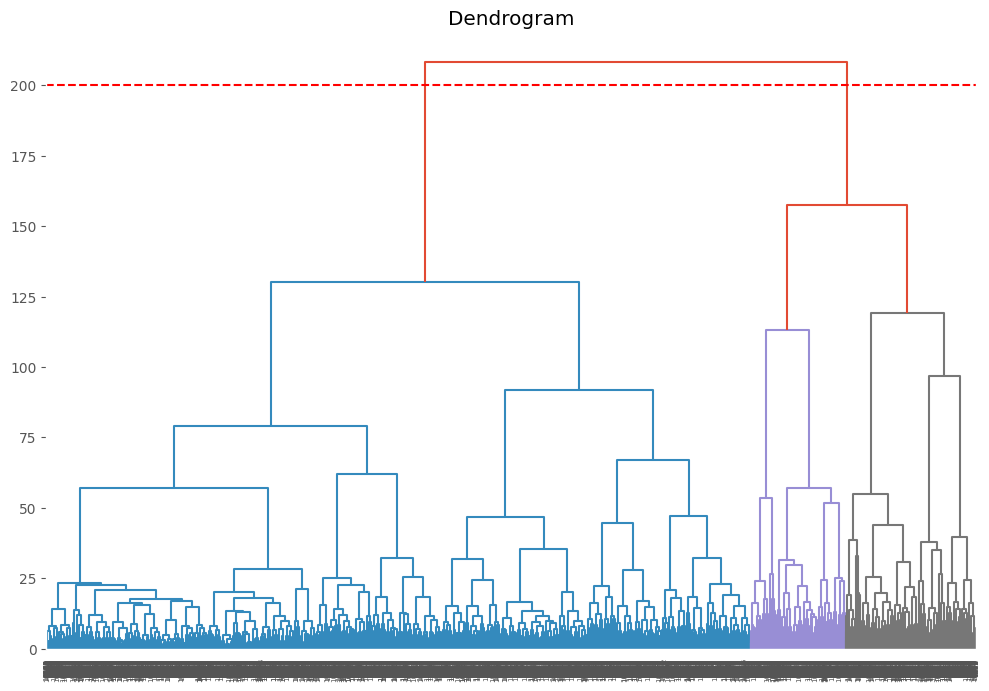

In [ ]:

plt.title("Dendrogram")
dendrogram = dendrogram(linkage(scaled_meps_df, method = "ward"))
plt.axhline(y = 200, color = "red", linestyle = "--")
plt.show()


In [ ]:

model = AgglomerativeClustering(n_clusters = 2, metric = "euclidean", linkage = "ward")
clusters_meps = model.fit_predict(scaled_meps_df)

meps_df["Cluster"] = clusters_meps
meps_df


,Age (in years),Little interest in activities,Felt depressed,Psychological distress score,Health limits work,Health limits activities,Health stopped social activity,TOTAL AMT PAID BY SELF/FAMILY - Out of pocket,"TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges",TOTAL AMT PAID BY MEDICARE,...,TOTAL AMT PAID BY PRIVATE INS,TOTAL HEALTH CARE EXP,Arthritis diagnosis,Asthma diagnosis,High BP diagnosis,Cancer diagnosis,Coronary heart disease,Diabetes diagnosis,High cholesterol,Cluster
DUPERSID,,,,,,,,,,,,,,,,,,,,,
2290009101,71,3,2,11,4,1,2,2020,15208,4734,...,0,6754,0,0,0,1,0,1,0,0
2290010102,59,0,0,1,3,2,5,841,64598,32,...,32578,33450,1,0,0,1,1,1,1,0
2290015101,83,2,1,5,4,1,4,387,5428,4499,...,0,4991,0,1,0,1,0,1,0,1
2290019102,49,0,0,0,1,3,5,1761,2215,0,...,859,2619,1,1,0,1,1,1,1,1
2290025102,65,0,0,2,1,3,5,1293,7741,98,...,7167,8556,1,1,0,1,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799660101,55,0,0,0,1,3,5,89,6162,0,...,38,3845,1,1,0,1,0,0,0,1
2799675101,64,3,1,9,5,1,3,250,30144,0,...,0,10209,0,1,0,0,1,1,0,0
2799694101,85,0,0,0,4,2,4,82,7328,2205,...,2765,5052,1,1,0,1,1,1,1,1


In [ ]:
#add this
cluster_meps_means = meps_df.groupby("Cluster").mean()
cluster_meps_means


,Age (in years),Little interest in activities,Felt depressed,Psychological distress score,Health limits work,Health limits activities,Health stopped social activity,TOTAL AMT PAID BY SELF/FAMILY - Out of pocket,"TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges",TOTAL AMT PAID BY MEDICARE,TOTAL AMT PAID BY MEDICAID,TOTAL AMT PAID BY PRIVATE INS,TOTAL HEALTH CARE EXP,Arthritis diagnosis,Asthma diagnosis,High BP diagnosis,Cancer diagnosis,Coronary heart disease,Diabetes diagnosis,High cholesterol
Cluster,,,,,,,,,,,,,,,,,,,,
0,64.083801,1.039294,0.962711,6.833200,3.009623,1.846431,3.357257,2327.061347,46787.476744,8833.483962,3255.172013,4282.391339,19564.056135,0.325982,0.733360,0.121893,0.748196,0.808340,0.603448,0.313152
1,63.519974,0.280794,0.217286,2.508067,1.830218,2.514597,4.416901,989.975800,10611.557106,2247.217798,297.530602,1806.379257,5965.147247,0.517798,0.856722,0.154417,0.785915,0.887964,0.738668,0.379641


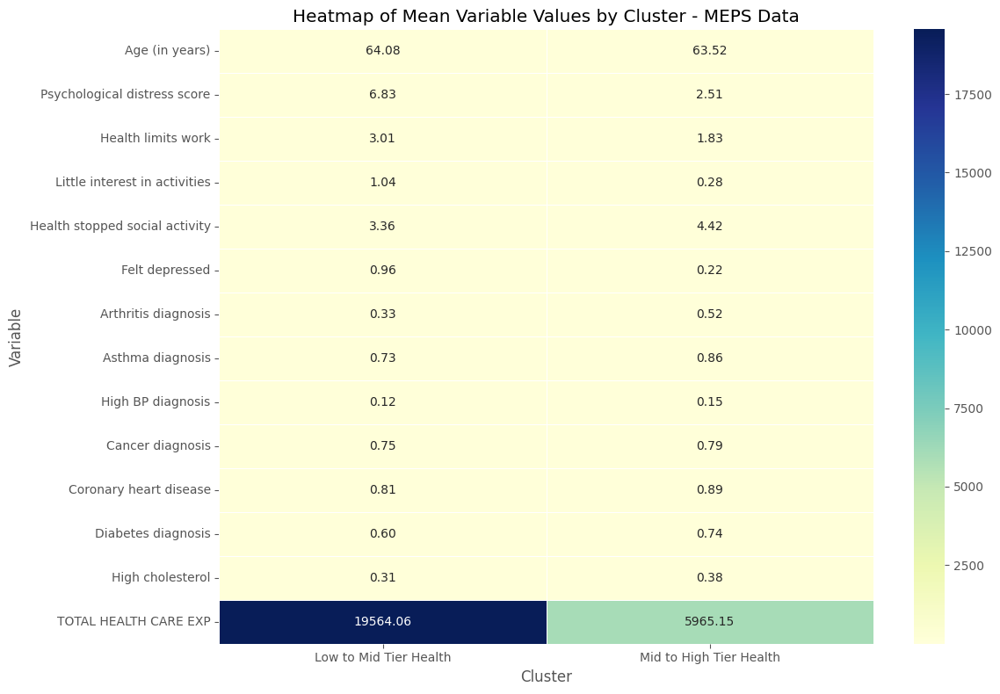

In [ ]:

cluster_meps_means.index = ["Low to Mid Tier Health", "Mid to High Tier Health"]

cluster_meps_means_hm = cluster_meps_means[["Age (in years)", "Psychological distress score", "Health limits work", "Little interest in activities",
                                            "Health stopped social activity", "Felt depressed", "Arthritis diagnosis", "Asthma diagnosis",
                                            "High BP diagnosis", "Cancer diagnosis", "Coronary heart disease",
                                            "Diabetes diagnosis", "High cholesterol", "TOTAL HEALTH CARE EXP"]]

sns.heatmap(cluster_meps_means_hm.T, annot = True, fmt = ".2f", cmap = "YlGnBu", linewidths = 0.5)
plt.title("Heatmap of Mean Variable Values by Cluster - MEPS Data")
plt.xlabel("Cluster")
plt.ylabel("Variable")
plt.tight_layout()
plt.show()



In [ ]:

f_stat = {}

p_value = {}

cluster_vars_group = {}


for col in meps_df.columns[:-1]:
  cluster_vars_group[col] = [meps_df[meps_df["Cluster"] == i][col]
                             for i in meps_df["Cluster"].unique()]

  f_stat[col], p_value[col] = f_oneway(*cluster_vars_group[col])


meps_anova_table = pd.DataFrame({"F-Statistic": f_stat, "p-value": p_value})
meps_anova_table["p-value"] = meps_anova_table["p-value"].apply(lambda x: "{:.12f}".format(x))
meps_anova_table





,F-Statistic,p-value
Age (in years),3.158665,0.075554422047
Little interest in activities,2045.516221,0.000000000000
Felt depressed,2346.392866,0.000000000000
Psychological distress score,2005.755028,0.000000000000
Health limits work,1903.553380,0.000000000000
Health limits activities,1758.178423,0.000000000000
Health stopped social activity,1925.011722,0.000000000000
TOTAL AMT PAID BY SELF/FAMILY - Out of pocket,894.643297,0.000000000000
"TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges",3381.726397,0.000000000000
TOTAL AMT PAID BY MEDICARE,2343.146159,0.000000000000


In [ ]:

meps_df["Health Label"] = meps_df["Cluster"].map({0: "Low to Mid Tier Health", 1: "Mid to High Tier Health"})

meps_df["Health Level"] = meps_df["Cluster"]




In [ ]:

cluster_meps_means["Health Label"] = meps_df["Health Label"].unique()


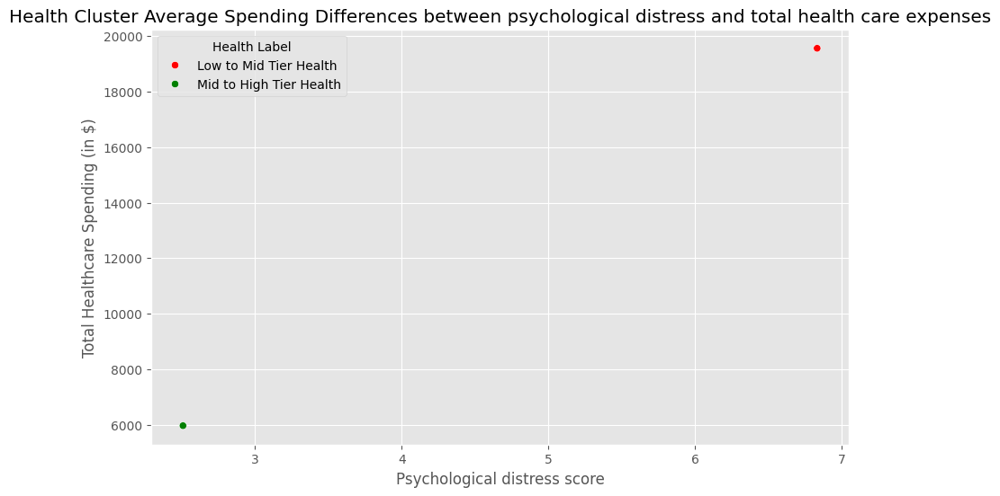

In [ ]:

colors = ["red", "green"]


plt.figure(figsize = (10, 6))
sns.scatterplot(data = cluster_meps_means, x = "Psychological distress score",
            y = "TOTAL HEALTH CARE EXP", hue = cluster_meps_means["Health Label"],
            palette = colors, legend = "full")


plt.title("Health Cluster Average Spending Differences between psychological distress and total health care expenses")
plt.xlabel("Psychological distress score")
plt.ylabel("Total Healthcare Spending (in $)")
plt.show()


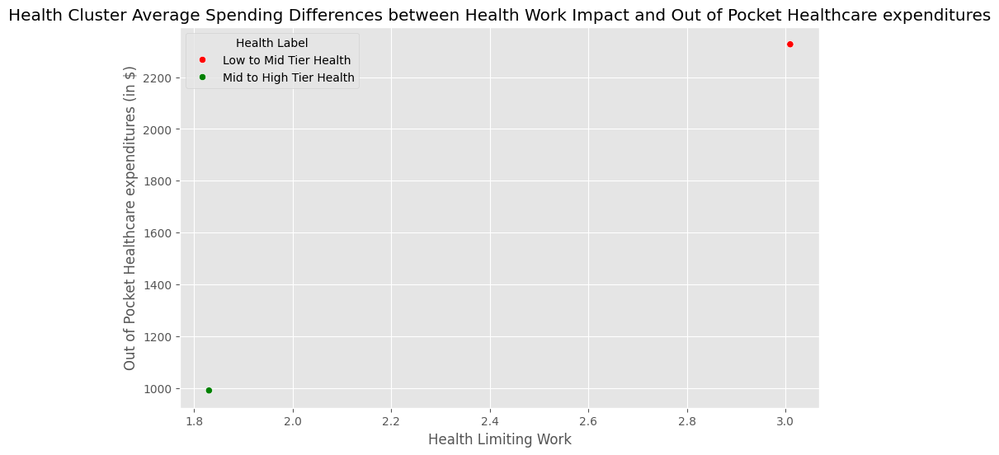

In [ ]:


colors = ["red", "green"]

plt.figure(figsize = (10, 6))
sns.scatterplot(data = cluster_meps_means, x = "Health limits work",
            y = "TOTAL AMT PAID BY SELF/FAMILY - Out of pocket", hue = cluster_meps_means["Health Label"],
            palette = colors, legend = "full")


plt.title("Health Cluster Average Spending Differences between Health Work Impact and Out of Pocket Healthcare expenditures")
plt.xlabel("Health Limiting Work")
plt.ylabel("Out of Pocket Healthcare expenditures (in $)")
plt.show()




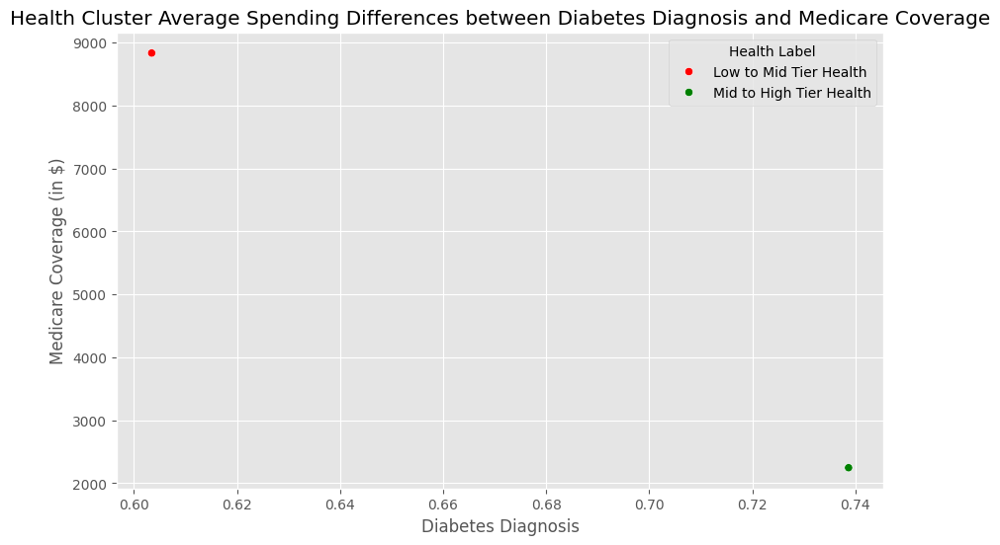

In [ ]:




colors = ["red", "green"]

plt.figure(figsize = (10, 6))
sns.scatterplot(data = cluster_meps_means, x = "Diabetes diagnosis",
            y = "TOTAL AMT PAID BY MEDICARE", hue = cluster_meps_means["Health Label"],
            palette = colors, legend = "full")


plt.title("Health Cluster Average Spending Differences between Diabetes Diagnosis and Medicare Coverage")
plt.xlabel("Diabetes Diagnosis")
plt.ylabel("Medicare Coverage (in $)")
plt.show()






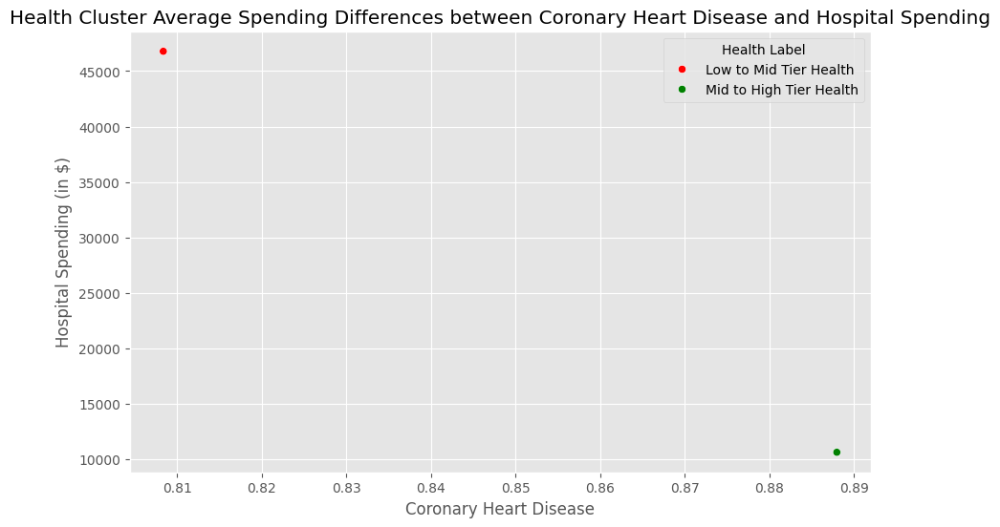

In [ ]:





colors = ["red", "green"]

plt.figure(figsize = (10, 6))
sns.scatterplot(data = cluster_meps_means, x = "Coronary heart disease",
            y = "TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges", hue = cluster_meps_means["Health Label"],
            palette = colors, legend = "full")



plt.title("Health Cluster Average Spending Differences between Coronary Heart Disease and Hospital Spending")
plt.xlabel("Coronary Heart Disease")
plt.ylabel("Hospital Spending (in $)")
plt.show()




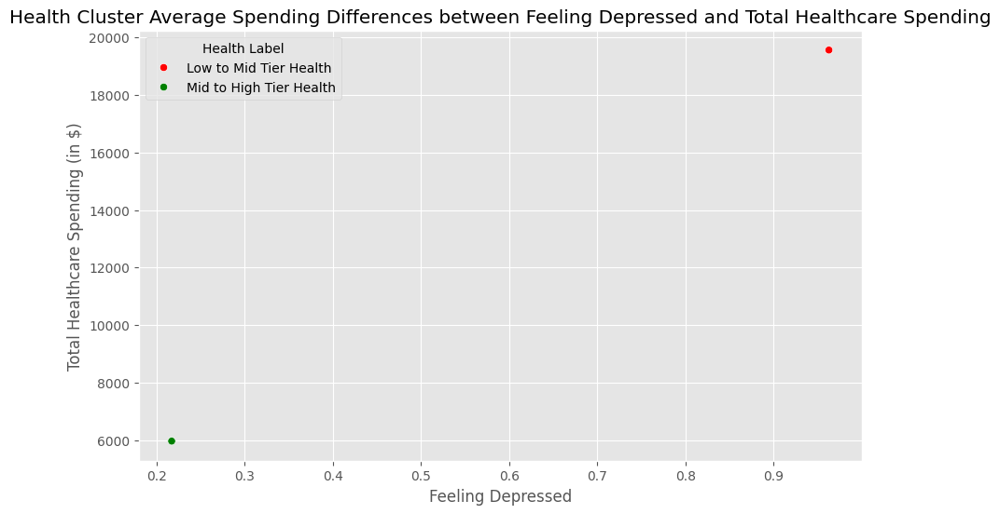

In [ ]:




colors = ["red", "green"]

plt.figure(figsize = (10, 6))
sns.scatterplot(data = cluster_meps_means, x = "Felt depressed",
            y = "TOTAL HEALTH CARE EXP", hue = cluster_meps_means["Health Label"],
            palette = colors, legend = "full")



plt.title("Health Cluster Average Spending Differences between Feeling Depressed and Total Healthcare Spending")
plt.xlabel("Feeling Depressed")
plt.ylabel("Total Healthcare Spending (in $)")
plt.show()






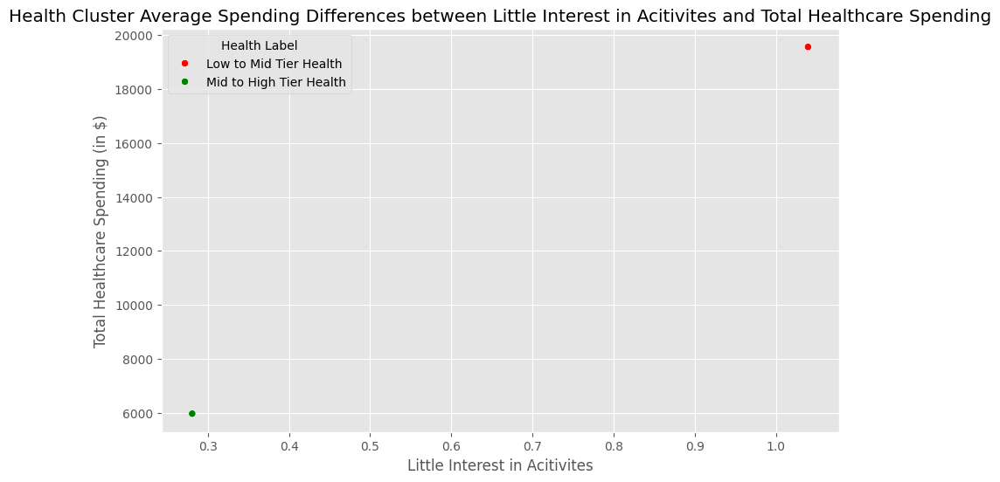

In [ ]:






colors = ["red", "green"]

plt.figure(figsize = (10, 6))
sns.scatterplot(data = cluster_meps_means, x = "Little interest in activities",
            y = "TOTAL HEALTH CARE EXP", hue = cluster_meps_means["Health Label"],
            palette = colors, legend = "full")



plt.title("Health Cluster Average Spending Differences between Little Interest in Acitivites and Total Healthcare Spending")
plt.xlabel("Little Interest in Acitivites")
plt.ylabel("Total Healthcare Spending (in $)")
plt.show()






In [ ]:

scaled_meps_df["Health Level"] = meps_df["Cluster"]
scaled_meps_df


,Age (in years),Little interest in activities,Felt depressed,Psychological distress score,Health limits work,Health limits activities,Health stopped social activity,TOTAL AMT PAID BY SELF/FAMILY - Out of pocket,"TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges",TOTAL AMT PAID BY MEDICARE,...,TOTAL AMT PAID BY PRIVATE INS,TOTAL HEALTH CARE EXP,Arthritis diagnosis,Asthma diagnosis,High BP diagnosis,Cancer diagnosis,Coronary heart disease,Diabetes diagnosis,High cholesterol,Health Level
DUPERSID,,,,,,,,,,,,,,,,,,,,,
2290009101,0.532375,3.176666,2.161484,1.622374,1.473081,-1.804928,-1.888720,0.348659,-0.133455,0.136208,...,-0.496298,-0.284819,0,0,0,1,0,1,0,0
2290010102,-0.337571,-0.581787,-0.536509,-0.556751,0.691322,-0.470783,0.733988,-0.233267,1.451141,-0.581278,...,6.224639,2.753371,1,0,0,1,1,1,1,0
2290015101,1.402320,1.923849,0.812488,0.314899,1.473081,-1.804928,-0.140248,-0.457351,-0.447230,0.100349,...,-0.496298,-0.485461,0,1,0,1,0,1,0,1
2290019102,-1.062526,-0.581787,-0.536509,-0.774664,-0.872195,0.863361,0.733988,0.220823,-0.550314,-0.586161,...,-0.319084,-0.755411,1,1,0,1,1,1,1,1
2290025102,0.097402,-0.581787,-0.536509,-0.338839,-0.872195,0.863361,0.733988,-0.010171,-0.373022,-0.571207,...,0.982275,-0.079739,1,1,0,1,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799660101,-0.627553,-0.581787,-0.536509,-0.774664,-0.872195,0.863361,0.733988,-0.604436,-0.423681,-0.586161,...,-0.488459,-0.615884,1,1,0,1,0,0,0,1
2799675101,0.024906,3.176666,0.812488,1.186549,2.254840,-1.804928,-1.014484,-0.524971,0.345741,-0.586161,...,-0.496298,0.108384,0,1,0,0,1,1,0,0
2799694101,1.547311,-0.581787,-0.536509,-0.774664,1.473081,-0.470783,-0.140248,-0.607891,-0.386272,-0.249696,...,0.074129,-0.478519,1,1,0,1,1,1,1,1


In [ ]:

model_2_df = meps_df[["Age (in years)", "Felt depressed", "High BP diagnosis", "Coronary heart disease",
                     "Diabetes diagnosis", "Cluster", "TOTAL HEALTH CARE EXP"]]

model_2_df.rename(columns = {"Cluster": "Health Level", "TOTAL HEALTH CARE EXP": "TOTAL HEALTH CARE EXP (IN $)"}, inplace = True)

model_2_df_xgb = model_2_df.copy()

model_2_df



<ipython-input-89-616184b4ce5c>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  model_2_df.rename(columns = {"Cluster": "Health Level", "TOTAL HEALTH CARE EXP": "TOTAL HEALTH CARE EXP (IN $)"}, inplace = True)


,Age (in years),Felt depressed,High BP diagnosis,Coronary heart disease,Diabetes diagnosis,Health Level,TOTAL HEALTH CARE EXP (IN $)
DUPERSID,,,,,,,
2290009101,71,2,0,0,1,0,6754
2290010102,59,0,0,1,1,0,33450
2290015101,83,1,0,0,1,1,4991
2290019102,49,0,0,1,1,1,2619
2290025102,65,0,0,1,0,1,8556
...,...,...,...,...,...,...,...
2799660101,55,0,0,0,0,1,3845
2799675101,64,1,0,1,1,0,10209
2799694101,85,0,0,1,1,1,5052


In [ ]:

final_df_model["Age (in years at screening)"] = final_df_model["Age (in years at screening)"].astype("int64")
final_df_model["Age (in years at screening)"].dtype


dtype('int64')

In [ ]:


scaler_model_2 = StandardScaler()


scaled_model_2_df = scaler_model_2.fit_transform(model_2_df.iloc[:, [0, -1]])
scaled_model_2_df = pd.DataFrame(scaled_model_2_df, columns = model_2_df.columns[[0, -1]], index = model_2_df.index)
scaled_model_2_df




,Age (in years),TOTAL HEALTH CARE EXP (IN $)
DUPERSID,,
2290009101,0.532375,-0.284819
2290010102,-0.337571,2.753371
2290015101,1.402320,-0.485461
2290019102,-1.062526,-0.755411
2290025102,0.097402,-0.079739
...,...,...
2799660101,-0.627553,-0.615884
2799675101,0.024906,0.108384
2799694101,1.547311,-0.478519


In [ ]:

model_2_df.drop(columns = ["Age (in years)", "TOTAL HEALTH CARE EXP (IN $)"], inplace = True)

model_2_df = pd.concat([model_2_df, scaled_model_2_df], axis = 1)

model_2_df



<ipython-input-92-fdebec6f9e1d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  model_2_df.drop(columns = ["Age (in years)", "TOTAL HEALTH CARE EXP (IN $)"], inplace = True)


,Felt depressed,High BP diagnosis,Coronary heart disease,Diabetes diagnosis,Health Level,Age (in years),TOTAL HEALTH CARE EXP (IN $)
DUPERSID,,,,,,,
2290009101,2,0,0,1,0,0.532375,-0.284819
2290010102,0,0,1,1,0,-0.337571,2.753371
2290015101,1,0,0,1,1,1.402320,-0.485461
2290019102,0,0,1,1,1,-1.062526,-0.755411
2290025102,0,0,1,0,1,0.097402,-0.079739
...,...,...,...,...,...,...,...
2799660101,0,0,0,0,1,-0.627553,-0.615884
2799675101,1,0,1,1,0,0.024906,0.108384
2799694101,0,0,1,1,1,1.547311,-0.478519


In [ ]:

final_train_model_df_2, final_test_model_df_2 = train_test_split(model_2_df, test_size = 0.2,
                                                                 random_state = 42)

x_train_model_df_2 = final_train_model_df_2.drop(columns = ["TOTAL HEALTH CARE EXP (IN $)"])
y_train_model_df_2 = final_train_model_df_2["TOTAL HEALTH CARE EXP (IN $)"]

x_test_model_df_2 = final_test_model_df_2.drop(columns = ["TOTAL HEALTH CARE EXP (IN $)"])
y_test_model_df_2 = final_test_model_df_2["TOTAL HEALTH CARE EXP (IN $)"]

print(x_train_model_df_2.shape)
print(y_train_model_df_2.shape)
print(x_test_model_df_2.shape)
print(y_test_model_df_2.shape)

print(final_train_model_df_2.shape)
print(final_test_model_df_2.shape)


y_train_model_df_2 = y_train_model_df_2.to_frame()
y_test_model_df_2 = y_test_model_df_2.to_frame()


(8243, 6)
(8243,)
(2061, 6)
(2061,)
(8243, 7)
(2061, 7)



y_test_meps


In [ ]:
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.callbacks import EarlyStopping



input_layer_meps = Input(shape = (x_train_model_df_2.shape[1], ), name = "Life_And_Stress")
hidden_layer_1_meps = Dense(64, activation = "relu", name = "Hidden_Layer_1_Model_2") (input_layer_meps)
hidden_layer_2_meps = Dense(32, activation = "relu", name = "Hidden_Layer_2_Model_2") (hidden_layer_1_meps)
hidden_layer_3_meps = Dense(16, activation = "relu", name = "Hidden_Layer_3_Model_2") (hidden_layer_2_meps)
output_layer_meps = Dense(1, activation = "linear", name = "Health_Spending_Costs") (hidden_layer_3_meps)

meps_nn_model = Model(inputs = input_layer_meps, outputs = output_layer_meps)


meps_nn_model.compile(optimizer = Adam(learning_rate = 0.001), loss = "mse",
                      metrics = ["mae", RootMeanSquaredError()])

meps_nn_model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Life_And_Stress (InputLayer)    │ (None, 6)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Hidden_Layer_1_Model_2 (Dense)  │ (None, 64)             │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Hidden_Layer_2_Model_2 (Dense)  │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Hidden_Layer_3_Model_2 (Dense)  │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Health_Spending_Costs (Dense)   │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,073 (12.00 KB)

 Trainable params: 3,073 (12.00 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
!pip install pydot
!pip install graphviz


plot_model(meps_nn_model, show_shapes = True, show_layer_names = True)


You must install pydot (`pip install pydot`) for `plot_model` to work.


In [ ]:

early_stop = EarlyStopping(monitor = "val_loss", patience = 10, restore_best_weights = True)

meps_nn_model.fit(x_train_model_df_2, y_train_model_df_2, batch_size = 32, epochs = 100,
                  validation_data = (x_test_model_df_2, y_test_model_df_2), callbacks = [early_stop])



Epoch 1/100
258/258 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.7875 - mae: 0.6521 - root_mean_squared_error: 0.8841 - val_loss: 0.4779 - val_mae: 0.5126 - val_root_mean_squared_error: 0.6913
Epoch 2/100
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4957 - mae: 0.5230 - root_mean_squared_error: 0.7039 - val_loss: 0.4825 - val_mae: 0.5026 - val_root_mean_squared_error: 0.6946
Epoch 3/100
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5114 - mae: 0.5348 - root_mean_squared_error: 0.7150 - val_loss: 0.4723 - val_mae: 0.5184 - val_root_mean_squared_error: 0.6872
Epoch 4/100
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4712 - mae: 0.5111 - root_mean_squared_error: 0.6860 - val_loss: 0.4686 - val_mae: 0.5045 - val_root_mean_squared_error: 0.6846
Epoch 5/100
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4699 - mae: 0.5067 - root_mean_squared_error: 0.6852 - val_loss: 0.4650 - val_mae: 0.5110 - val_root_mean_squared_error: 0.6819
Epoch 6/100
258/258 ━━━━━━━━━━━━━━━━━━━━ 1s 3

In [ ]:

results = meps_nn_model.evaluate(x_test_model_df_2, y_test_model_df_2)
print(f"Loss: {results[0]}")
print(f"Mean Absolute Error: {results[1]}")
print(f"Root Mean Squared Error: {results[2]}")



65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4423 - mae: 0.5026 - root_mean_squared_error: 0.6646
Loss: 0.46243816614151
Mean Absolute Error: 0.5105252265930176
Root Mean Squared Error: 0.6800280809402466


In [ ]:

y_pred_model_2 = meps_nn_model.predict(x_test_model_df_2)
y_pred_model_2 = pd.DataFrame(y_pred_model_2, columns = y_test_model_df_2.columns, index = y_test_model_df_2.index)
y_true_model_2 = y_test_model_df_2

target_index = [-1]

scaler_means = scaler_model_2.mean_[target_index]
scaler_scale = scaler_model_2.scale_[target_index]

y_pred = y_pred_model_2 * scaler_scale + scaler_means
y_true = y_true_model_2 * scaler_scale + scaler_means


from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error
mse = mean_squared_error(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mse)

print(f"MSE: ${mse:,.0f}, MAE: ${mae:,.0f}, RMSE: ${rmse:,.0f}")


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step  
MSE: $35,703,947, MAE: $4,486, RMSE: $5,975


In [ ]:

x = meps_df.drop(columns = ['TOTAL AMT PAID BY SELF/FAMILY - Out of pocket',
       'TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges',
       'TOTAL AMT PAID BY MEDICARE', 'TOTAL AMT PAID BY MEDICAID',
       'TOTAL AMT PAID BY PRIVATE INS', 'Health Label', 'TOTAL HEALTH CARE EXP', 'Cluster'])
y = meps_df["TOTAL HEALTH CARE EXP"]


x_const = sm.add_constant(x)
ols_model = sm.OLS(y, x_const).fit()

robust_results = ols_model.get_robustcov_results(cov_type = "HC1")

print(robust_results.summary())



                              OLS Regression Results                             
Dep. Variable:     TOTAL HEALTH CARE EXP   R-squared:                       0.500
Model:                               OLS   Adj. R-squared:                  0.499
Method:                    Least Squares   F-statistic:                     450.6
Date:                   Wed, 07 May 2025   Prob (F-statistic):               0.00
Time:                           21:04:09   Log-Likelihood:            -1.0462e+05
No. Observations:                  10304   AIC:                         2.093e+05
Df Residuals:                      10288   BIC:                         2.094e+05
Df Model:                             15                                         
Covariance Type:                     HC1                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------

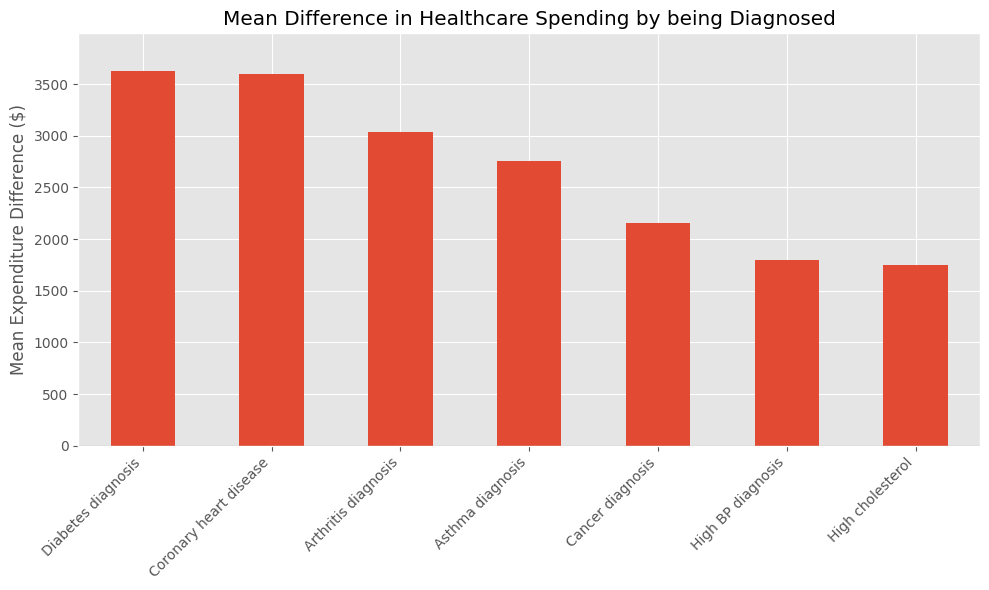

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


disease_vars = [
    "Coronary heart disease", "Cancer diagnosis", "Diabetes diagnosis",
    "Arthritis diagnosis",   "Asthma diagnosis",  "High BP diagnosis",
    "High cholesterol"
]


diffs = {}
for var in disease_vars:
    means = meps_df.groupby(var)["TOTAL HEALTH CARE EXP"].mean()
    raw_diff = means.loc[0] - means.loc[1]
    diffs[var] = raw_diff

diffs_series = pd.Series(diffs).sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(10,6))
diffs_series.plot(kind="bar", ax=ax)
ax.axhline(0, color="k", linewidth=0.8)
ax.set_title("Mean Difference in Healthcare Spending by being Diagnosed")
ax.set_ylabel("Mean Expenditure Difference ($)")
ax.set_ylim(0, diffs_series.max() * 1.1)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


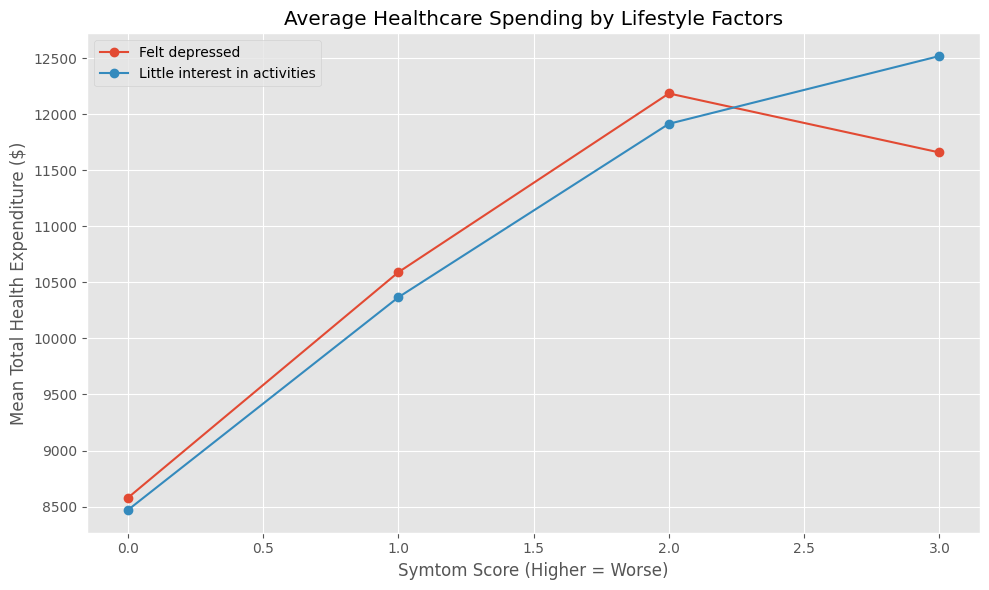

In [ ]:


fig, ax = plt.subplots(figsize = (10, 6))

lifestyle_factors = ["Felt depressed", "Little interest in activities"]

for var in lifestyle_factors:
  lifestyle_grouped_means = meps_df.groupby(var)["TOTAL HEALTH CARE EXP"].mean()
  ax.plot(lifestyle_grouped_means.index, lifestyle_grouped_means.values, marker = "o", label = var)

ax.set_title("Average Healthcare Spending by Lifestyle Factors")
ax.set_xlabel("Symtom Score (Higher = Worse)")
ax.set_ylabel("Mean Total Health Expenditure ($)")
ax.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


x_vif = meps_df.drop(columns=[
    'TOTAL AMT PAID BY SELF/FAMILY - Out of pocket',
    'TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges',
    'TOTAL AMT PAID BY MEDICARE',
    'TOTAL AMT PAID BY MEDICAID',
    'TOTAL AMT PAID BY PRIVATE INS',
    'Health Label',
    'TOTAL HEALTH CARE EXP',
])



vif_data = pd.DataFrame()
vif_data["feature"] = x_vif.columns
vif_data["VIF"] = [variance_inflation_factor(x_vif.values, i) for i in range(x_vif.shape[1])]
print(vif_data.sort_values(by="VIF", ascending=False))



                           feature        VIF
15                    Health Level        inf
14                         Cluster        inf
6   Health stopped social activity  25.380767
0                   Age (in years)  21.865668
5         Health limits activities  20.013392
11          Coronary heart disease   7.667425
4               Health limits work   7.147937
8                 Asthma diagnosis   6.081346
3     Psychological distress score   5.295538
2                   Felt depressed   4.530867
10                Cancer diagnosis   4.515326
1    Little interest in activities   3.985888
12              Diabetes diagnosis   3.638216
7              Arthritis diagnosis   2.217270
13                High cholesterol   1.734215
9                High BP diagnosis   1.192239


/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


In [ ]:

OLS_2_df = meps_df.copy()

OLS_2_df["AGE_X_CANCER"] = OLS_2_df["Age (in years)"] * OLS_2_df["Cancer diagnosis"]
OLS_2_df["DEPRESSION_X_DIABETES"] = OLS_2_df["Felt depressed"] * OLS_2_df["Diabetes diagnosis"]
OLS_2_df["ASTHMA_X_HIGH_BP"] = OLS_2_df["Asthma diagnosis"] * OLS_2_df["High BP diagnosis"]
OLS_2_df["MENTAL_HEALTH_X_PHYSICAL_HEALTH"] = OLS_2_df["Psychological distress score"] * OLS_2_df["Health limits activities"]
OLS_2_df["HIGH_CHOLESTEROL_X_HIGH_BP"] = OLS_2_df["High cholesterol"] * OLS_2_df["High BP diagnosis"]


#OLS_2_df["Functional_Limitation_Index"] = (
 #   OLS_2_df["Health limits work"] +
 #   OLS_2_df["Health limits activities"] +
 #   OLS_2_df["Health stopped social activity"]
#)


OLS_2_df.drop(columns=["Health stopped social activity"], inplace=True)


OLS_2_df["Age_Group"] = pd.cut(
    OLS_2_df["Age (in years)"],
    bins=[0, 40, 60, 80, 100],
    labels=["<40", "40–60", "60–80", "80+"]
)



OLS_2_df = pd.get_dummies(OLS_2_df, columns = ["Age_Group"], drop_first=False, dtype = "int64")

OLS_2_df["AGE_<40_X_DEPRESSION"] = OLS_2_df["Age_Group_<40"] * OLS_2_df["Felt depressed"]
OLS_2_df["AGE_40-60_X_DEPRESSION"] = OLS_2_df["Age_Group_40–60"] * OLS_2_df["Felt depressed"]
OLS_2_df["AGE_60-80_X_DEPRESSION"] = OLS_2_df["Age_Group_60–80"] * OLS_2_df["Felt depressed"]

OLS_2_df.drop(columns = ["Age (in years)"], inplace=True)



OLS_2_df["LOG_TOTAL_EXP"] = np.log(OLS_2_df["TOTAL HEALTH CARE EXP"] + 1)


x = OLS_2_df.drop(columns=[
    'TOTAL AMT PAID BY SELF/FAMILY - Out of pocket',
    'TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges',
    'TOTAL AMT PAID BY MEDICARE',
    'TOTAL AMT PAID BY MEDICAID',
    'TOTAL AMT PAID BY PRIVATE INS',
    'Health Label',
    'TOTAL HEALTH CARE EXP',
    'LOG_TOTAL_EXP',
    'Psychological distress score',
    'Age_Group_80+',
    'Cluster'
])

y = OLS_2_df['LOG_TOTAL_EXP']


x_const = sm.add_constant(x)
ols_model_2 = sm.OLS(y, x_const).fit()
TOTAL_Spend_OLS = ols_model_2.get_robustcov_results(cov_type="HC1")

print(TOTAL_Spend_OLS.summary())



                            OLS Regression Results                            
Dep. Variable:          LOG_TOTAL_EXP   R-squared:                       0.407
Model:                            OLS   Adj. R-squared:                  0.406
Method:                 Least Squares   F-statistic:                     483.4
Date:                Wed, 07 May 2025   Prob (F-statistic):               0.00
Time:                        21:04:13   Log-Likelihood:                -11514.
No. Observations:               10304   AIC:                         2.308e+04
Df Residuals:                   10280   BIC:                         2.325e+04
Df Model:                          23                                         
Covariance Type:                  HC1                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

In [ ]:


xgb_train, xgb_test = train_test_split(meps_df, test_size = 0.2, random_state = 42)

xgb_x_train = xgb_train.drop(columns = ['TOTAL AMT PAID BY SELF/FAMILY - Out of pocket',
    'TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges',
    'TOTAL AMT PAID BY MEDICARE',
    'TOTAL AMT PAID BY MEDICAID',
    'TOTAL AMT PAID BY PRIVATE INS',
    'Health Label',
    'TOTAL HEALTH CARE EXP', 'Cluster', 'Health Level'])

xgb_y_train = xgb_train['TOTAL HEALTH CARE EXP']


xgb_x_test = xgb_test.drop(columns = ['TOTAL AMT PAID BY SELF/FAMILY - Out of pocket',
    'TOTAL HEALTH CARE CHARGES, EXCL RX - Hospital Charges',
    'TOTAL AMT PAID BY MEDICARE',
    'TOTAL AMT PAID BY MEDICAID',
    'TOTAL AMT PAID BY PRIVATE INS',
    'Health Label',
    'TOTAL HEALTH CARE EXP', 'Cluster', 'Health Level'])

xgb_y_test = xgb_test['TOTAL HEALTH CARE EXP']


print(xgb_x_train.shape)
print(xgb_y_train.shape)
print(xgb_x_test.shape)
print(xgb_y_test.shape)





(8243, 14)
(8243,)
(2061, 14)
(2061,)


In [ ]:
!pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.9/253.9 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.1/318.1 MB 3.4 MB/s eta 0:00:00


In [ ]:

from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score


param_grid = {
    "n_estimators":     [10, 50, 100, 200, 300],
    "max_depth":        [3, 4, 5],
    "learning_rate":    [0.01, 0.05, 0.1],
    "subsample":        [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0],
    "gamma":            [0, 1],
    "reg_alpha":        [0, 0.5],
    "reg_lambda":       [1, 2],
}


xgb_reg = XGBRegressor(
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1,
    verbosity=1
)


grid = GridSearchCV(
    estimator   = xgb_reg,
    param_grid  = param_grid,
    cv          = 5,
    scoring     = "r2",
    n_jobs      = -1,
    verbose     = 2
)


grid.fit(xgb_x_train, xgb_y_train)


best = grid.best_estimator_
print("Best CV R² score:   ", grid.best_score_)
print("Best hyper-params:  ", grid.best_params_)


r2_in = r2_score(xgb_y_train, best.predict(xgb_x_train))
print(f"In-sample R²:       {r2_in:.3f}")




Fitting 5 folds for each of 1440 candidates, totalling 7200 fits
Best CV R² score:    0.11867344379425049
Best hyper-params:   {'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'reg_alpha': 0.5, 'reg_lambda': 2, 'subsample': 0.8}
In-sample R²:       0.149


In [ ]:

from sklearn.metrics import mean_squared_error


y_pred_test_xgb = grid.best_estimator_.predict(xgb_x_test)


rmse_test = np.sqrt(mean_squared_error(xgb_y_test, y_pred_test_xgb))


r2_test = r2_score(xgb_y_test, y_pred_test_xgb)

print(f"Test RMSE: ${rmse_test:,.0f}")
print(f"Test R²:   {r2_test:.3f}")



Test RMSE: $8,038
Test R²:   0.160


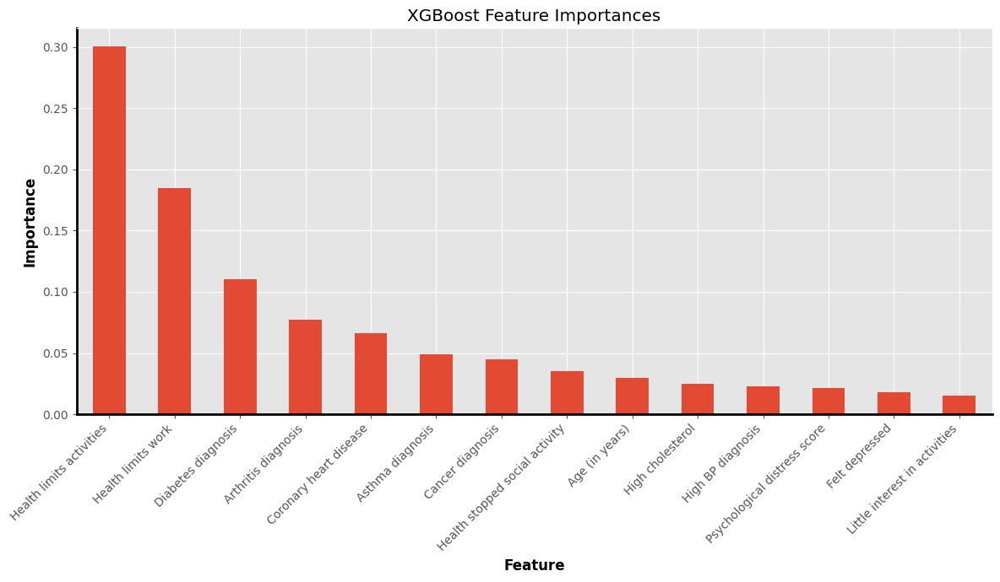

In [ ]:




feature_importances = grid.best_estimator_.feature_importances_
feature_names = xgb_x_train.columns


feat_importance_series = pd.Series(feature_importances, index=feature_names)
feat_importance_series = feat_importance_series.sort_values(ascending=False)


fig, ax = plt.subplots(figsize=(12, 7))
feat_importance_series.plot(kind='bar', ax=ax)
ax.set_title("XGBoost Feature Importances")
ax.set_ylabel("Importance", fontweight='bold', color='black')
ax.set_xlabel("Feature", fontweight='bold', color='black')

plt.xticks(rotation=45, ha="right")

plt.tight_layout()

